<a href="https://colab.research.google.com/github/UberEth/Covid-Analysis-Colab/blob/master/Covid_19_Notebook.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>


# **Project Introduction**
**This notebook pulls COVID case, death and hospitalization data over time.**

It clones the repo managed by Johns Hopkins and the COVID Data Project from the following repositories:

* https://github.com/CSSEGISandData/COVID-19 
* https://github.com/COVID19Tracking







# **Foundation Code**

## Clone GIT Repos



In [ ]:
### Clone Johns Hopkins / COVID Data Project data

!rm -r '/content/COVID-19'
!git clone https://github.com/CSSEGISandData/COVID-19.git || (cd COVID-19 ; git pull)
!pwd

!rm -r '/content/covid-tracking-data'
!git clone https://github.com/COVID19Tracking/covid-tracking-data.git || (cd covid-tracking-data ; git pull)

!git clone https://github.com/UberEth/Data-Science-DataSets.git || (cd Data-Science-DataSets; git pull)

#Data Engineering step - pop first 2 lines of cdc.csv file
!tail -n -62 covid-tracking-data/data/cdc.csv > covid-tracking-data/data/cdc2.csv


Cloning into 'COVID-19'...
remote: Enumerating objects: 7, done.
remote: Counting objects: 100% (7/7), done.
remote: Compressing objects: 100% (7/7), done.
remote: Total 36022 (delta 0), reused 2 (delta 0), pack-reused 36015
Receiving objects: 100% (36022/36022), 184.64 MiB | 26.24 MiB/s, done.
Resolving deltas: 100% (21698/21698), done.
/content
Cloning into 'covid-tracking-data'...
remote: Enumerating objects: 41, done.
remote: Counting objects: 100% (41/41), done.
remote: Compressing objects: 100% (30/30), done.
remote: Total 5111 (delta 22), reused 28 (delta 11), pack-reused 5070
Receiving objects: 100% (5111/5111), 11.41 MiB | 21.83 MiB/s, done.
Resolving deltas: 100% (3607/3607), done.
fatal: destination path 'Data-Science-DataSets' already exists and is not an empty directory.
Already up to date.


## **Establish Python Environment/Utilities**




In [ ]:
# Setup Python Environment
import io, pandas as pd, matplotlib.pyplot as plt, datetime as dt, numpy as np
import matplotlib.pyplot as plt
import os
from scipy.stats.mstats import gmean
from datetime import date
import seaborn

import warnings
warnings.filterwarnings('ignore')

print(dt.datetime.now())
yesterday = dt.datetime.now() - dt.timedelta(days=1)
yesterday_str = yesterday.strftime("%m-%d-%Y")
yesterday_csv = yesterday.strftime("%m-%d-%Y") + ".csv"
print("Yesterday's Date: {0}, CSV FILE: {1}".format(yesterday,yesterday_csv))
print('\n\n\n\n')

# Flags for setting verbosity level for notebook
verbose = True
transpose = False
sums = False

def zero_date(theDate):
  return theDate.strftime("%-m/%-d/%-y")

# Function Library
def print_details(name='Data Source Details', df=''):
    
    f = open('/content/workfile','w+')  
    print("---------------------------------------------------------------------")
    print("------- ", name)
    print("---------------------------------------------------------------------")

    print(df.tail(50).to_markdown())

def prep_list_of_str(str_list):
  i = 0
  ret_str = ""
  sizeofList = len(str_list) 
  while i < sizeofList :
    ret_str = ret_str + str_list[i] + ', '
    i += 1

  return ret_str[:-2]

def add_date(row, date_string, flag):
  month = date_string[0:2]
  day = date_string[3:5]
  year = date_string[6:10]
  full_date = year+'-'+month+'-'+day

  dt_date = date(int(year), int(month), int(day))
  week_number = dt_date.isocalendar()[1]
  
  if flag == 'Y':
    return int(year)
  elif flag == 'D':
    return int(day)
  elif flag == 'M':
    return int(month)
  elif flag == 'F': #datetime
    return dt_date
  elif flag == 'F1': #string
    return full_date
  elif flag == 'W':
    return week_number
  elif flag == 'S':
    return get_season(date_string)
  elif flag == 'Q':
    return get_calendar_qtr(date_string)
  else: return ''

def get_calendar_qtr(date_string):
  month = int(date_string[0:2])
  if month >=1 and month <=3: return 1
  elif month >3 and month <=6: return 2
  elif month >6 and month <=9: return 3
  elif month >9 and month <=12: return 4
  else: return '0'

def get_season(date_string):
  month = date_string[0:2]
  day = date_string[3:5]

  ordinal = int(month+day)
  
  if ((ordinal>1221 and ordinal < 1231) or (ordinal>101 and ordinal <321)) :
      return 'Winter'
  elif ordinal >= 321 and ordinal <621:
      return 'Spring'
  elif ordinal >= 621 and ordinal <921:
      return 'Summer'
  elif ordinal >=921 and ordinal <1221:
      return 'Fall'
  else:
      return 'Error'

print(prep_list_of_str(['Jan', 'Feb', 'March']))
print(zero_date(dt.datetime.now()))


2020-06-22 12:35:10.681993
Yesterday's Date: 2020-06-21 12:35:10.682286, CSV FILE: 06-21-2020.csv





Jan, Feb, March
6/22/20


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


# Data Load/Prep

# Time Series Data Load/Prep

## Load COVID Data into Pandas Dataframes
Loads Data From
1. Johns Hopkins Time Series Reports - GITHUB Repo
2. Johns Hopkins Daily Reports - GITHUB Repo
3. COVID-19 Open Data Hospitalization Data -GITHUB Repo
4. Supporting Data Sets (County Demographices etc., ) - Data sourced from US Census/US Bureau of Labor Statistics (BLS)

Creates Summaries and Trasnpose dataframes where applicable.



### COVID TIME SERIES REPORTS - Data Load / Prep

In [ ]:
# Set Analytics Max Date
# Import Hopkins COVID Data Sets
# Global JH Time Series Detail
global_deaths = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")
global_confirmed = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")
# Create Transpose(s)
G_D_T = global_deaths.T
G_D_C = global_confirmed.T
if verbose: print_details('Global Deaths', global_deaths)
if verbose: print_details('Global Confirmed', global_confirmed)
if transpose: print_details('Tranpose of Global Deaths', G_D_T)
if transpose: print_details('Transpose of Global Confirmed', G_D_C)

# US JH Time Series Detail
US_deaths = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_US.csv")
US_confirmed = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_US.csv")
# Create Transpose(s)
US_D_T = US_deaths.T
US_C_T = US_confirmed.T
if verbose: print_details('US Deaths',US_deaths)
if verbose: print_details('US Confirmed', US_confirmed)
if transpose: print_details('Transpose of US Deaths',US_D_T)
if transpose: print_details('Transpose of US Confirmed', US_C_T)

# Yesterday's Daily Data Sets
# Global JH Daily Data
global_daily = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + yesterday_csv)
global_daily.rename(columns={"Admin2":"County/Sector","Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)
# Create Transpose
G_DAY_T = global_daily.T
if verbose: print_details('Global Daily Data deaths/confirmed', global_daily)
if transpose: print_details('Transpose of Global Daily', G_DAY_T)

# US JH Daily Data
US_daily = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports_us/" + yesterday_csv)
US_daily.rename(columns={"Admin2":"County/Sector","Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)
# Create Transpose
US_DAY_T = US_daily.T
if verbose: print_details('US Daily Data deaths/confirmed', US_daily)
if transpose: print_details('Transpose of US Daily Data', US_DAY_T)

# Summarize JH Global Time Series Date
global_deaths_sum = global_deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
global_confirmed_sum = global_confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
# Create Transpose(s)
G_D_S_T = global_deaths_sum.T
G_C_S_T = global_confirmed_sum.T
if sums: print_details('Global Deaths Summarized', global_deaths_sum)
if sums: print_details('Global Confirmed Summarized', global_confirmed_sum)
if transpose: print_details('Transpose of Global Deaths Summarized', G_D_S_T)
if transpose: print_details('Transpose of Global Confirmed Summarized',G_C_S_T) 

# Group JH US Time Series by State, Date
US_deaths_by_state_sum = US_deaths.drop(["Lat", "Long_", 'UID', 'code3', "FIPS", "iso2", "iso3", "Country_Region"], axis=1).groupby(["Province_State"]).sum()
US_confirmed_by_state_sum = US_confirmed.drop(["Lat", "Long_", "UID", "code3", "FIPS", "iso2", "iso3", "Country_Region"], axis=1).groupby(["Province_State"]).sum()
# Create Transpose(s)
US_D_STATE_T = US_deaths_by_state_sum.T
US_C_STATE_T = US_confirmed_by_state_sum.T
if sums: print_details('US Deaths Summarized', US_deaths_by_state_sum)
if sums: print_details('US Confirmed Summarized', US_confirmed_by_state_sum)
if transpose: print_details('Transpose of US Deaths Summarized', US_D_STATE_T)
if transpose: print_details('Transpose of US Confirmed Summarized', US_C_STATE_T) 

# Group JH US Time Series by State, County, Date
US_deaths_by_state_county_sum = US_deaths.drop(["Lat", "Long_", 'UID', 'code3', "FIPS", "iso2", "iso3"], axis=1).groupby(["Country_Region","Province_State", "Admin2"]).sum()
US_confirmed_by_state_county_sum = US_confirmed.drop(["Lat", "Long_", "UID", "code3", "FIPS", "iso2", "iso3"], axis=1).groupby(["Country_Region", "Province_State", "Admin2"]).sum()
# Create Transpose(s)
US_D_STATE_CTY_T = US_deaths_by_state_county_sum.T
US_C_STATE_CTY_T = US_confirmed_by_state_county_sum.T
if sums: print_details('US Deaths by State/County Summarized', US_deaths_by_state_county_sum)
if sums: print_details('US Confirmed by State/County Summarized',US_confirmed_by_state_county_sum)
if transpose: print_details('Transpose of US Deaths State/County Summarized',US_D_STATE_CTY_T)
if transpose: print_details('Transpose of US Confirmed State/County Summarized', US_C_STATE_CTY_T) 



NameError: ignored

In [ ]:
print (US_deaths.tail(100).to_markdown())
#print((US_deaths['Province_State'] == 'New York').tail(100).to_markdown())

In [ ]:
# ------------------------------------------------------------------------------------------------
# Load all JH Daily Report Data 
# ------------------------------------------------------------------------------------------------
verbose = False

tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + yesterday_csv)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State", "Latitude":'Lat', "Longitude":'Long_', "Last Update":'Last_Update'}, inplace=True)

#filter non US Data 
#tmp = tmp[tmp['Country/Region'] == 'US']

#parse date, season
tmp['Year'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'Y'), axis=1)
tmp['Day'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'D'), axis=1)
tmp['Month'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'M'), axis=1)
tmp['Date'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'F'), axis=1)
tmp['Week'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'W'), axis=1)
tmp['Season'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'S'), axis=1)
tmp['Calendar_Quarter'] = tmp.apply(lambda row: add_date(row, yesterday_csv, 'Q'), axis=1)

for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
    if not x.endswith("2020.csv") or x == yesterday_csv:
        continue
    try:
      tmp1 = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
      tmp1.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State", "Latitude":'Lat', "Longitude":'Long_', "Last Update":'Last_Update'}, inplace=True)
      
      #filter non US Data
      #tmp1 = tmp1[tmp1['Country/Region'] == 'US']

      #parse dates
      tmp1['Year'] = tmp1.apply(lambda row: add_date(row, x, 'Y'), axis=1)
      tmp1['Day'] = tmp1.apply(lambda row: add_date(row, x, 'D'), axis=1)
      tmp1['Month'] = tmp1.apply(lambda row: add_date(row, x, 'M'), axis=1)
      tmp1['Date'] = tmp1.apply(lambda row: add_date(row, x, 'F'), axis=1)
      tmp1['Week'] = tmp1.apply(lambda row: add_date(row, x, 'W'), axis=1)
      tmp1['Season'] = tmp1.apply(lambda row: add_date(row, x, 'S'), axis=1)
      tmp1['Calendar_Quarter'] = tmp1.apply(lambda row: add_date(row, x, 'Q'), axis=1)
      tmp = tmp.append(tmp1, ignore_index=True)
    except:
      pass

tmp["Date"] = pd.to_datetime(tmp["Date"], format="%Y-%m-%d")

#CREATE US/GLOBAL DFs
US_data = tmp[tmp["Country/Region"] == 'US']
GLOBAL_data = tmp[tmp["Country/Region"] != 'US']

#Create DATETIME column from DATE column the drop DATE column
US_data['Datetime'] = pd.to_datetime(US_data['Date'])
US_data.drop(['Date'], axis=1, inplace=True)
GLOBAL_data['Datetime'] = pd.to_datetime(GLOBAL_data['Date'])
GLOBAL_data.drop(['Date'], axis=1, inplace=True)

# ------------------------------------------------------------------
# MAKE COPIES - USED LATER IN SCRIPT
# __________________________________________________________________
us = US_data.copy()
glob = GLOBAL_data.copy()

# ------------------------------------------------------------------
# COVID Data Project Loads - COVID Hospitalization Data US
# __________________________________________________________________

cdc_daily = pd.read_csv("covid-tracking-data/data/cdc2.csv")
if verbose: print_details('CDC Daily Statistics', cdc_daily)

# county data feed is broken
# county_hosp = pd.read_csv("covid-tracking-data/data/counties.csv")
# if verbose: print(county_hosp)

states_current_hosp = pd.read_csv("covid-tracking-data/data/states_current.csv")
if verbose: print_details('US States Current Hospitalization', states_current_hosp)
states_daily_hosp = pd.read_csv("covid-tracking-data/data/states_daily_4pm_et.csv")
if verbose: print_details('US States Daily Hospitalization',states_daily_hosp)
states_info_hosp = pd.read_csv("covid-tracking-data/data/states_info.csv")
if verbose: print_details('US States Hospitalization Info',states_info_hosp)
us_current_hosp = pd.read_csv("covid-tracking-data/data/us_current.csv")
if verbose: print_details('US Current Hospitalization', us_current_hosp)
us_daily_hosp = pd.read_csv("covid-tracking-data/data/us_daily.csv")
if verbose: print_details('US Daily Hospitalization', us_daily_hosp)

a_d_h = states_daily_hosp

# ------------------------------------------------------------------
# LOAD State/County Demographics 
# LOAD State Geocoding
# __________________________________________________________________
US_county_demographics = pd.read_csv("Data-Science-DataSets/US-County-Detail.csv")
US_state_geocodes = pd.read_csv("Data-Science-DataSets/US-State-GeoCodes.csv")

# ------------------------------------------------------------------
# JOIN SUPPORTING US STATE/COUNTY DASETS WITH HOPKINS COVID DATA
# __________________________________________________________________
a_us = US_data.copy()
a_us.rename(columns = {'Admin2': 'County','Province/State': 'State' },inplace=True)
b_us = US_county_demographics.copy()
c_us = US_state_geocodes.copy()

# Join US Daily with US STATE/COUNTY DETAILS by FIPS CODES
inner = pd.merge(a_us, b_us, on=['FIPS'], how='left')
inner.rename(columns = {'State_x': 'State','County_x': 'County' },inplace=True)
inner.drop(["State_y", "County_y"], axis='columns')

# Join US Daily with STATE GEOCODING by State
c_us.rename(columns = {'Name': 'State'},inplace=True)
inner2 = pd.merge(inner, c_us, on=['State'], how='left')

# US_Covid is now prepared to provide answeres to all questions related to trends
# It is more deeply geocoded and contains state/county demographics from the 2018 BLS datasets
US_Covid = inner2

# ------------------------------------------------------------------
# CALCULATE DAILY DEATHS/CONFIRMED
# __________________________________________________________________
# sf = (US_Covid[['Datetime','Region','State','County','Deaths', 'Confirmed', 'Recovered', 'Active','FIPS']])
sf = US_Covid

sf['yDeaths']=0
sf['yConfirmed']=0
sf['yRecovered']=0
sf['yActive]=']=0
sf1 = sf[(sf['State'] == 'New York') & (sf['County'] =='New York City')]
sf1.sort_values(by=['State','County','Datetime'], ascending=True, inplace=True)

a = (sf1[sf1['Datetime'] == '2020-06-14']) 
b = (sf1[sf1['Datetime'] == '2020-06-20']) 
if b.empty: print ('date not found')

rows,cols = sf1.shape
#print(rows,cols)
#print (range(rows))

for i in range(rows):
  df = sf1.iloc[i:i+1] 
  tt = df.iloc[0,0] #DateTime
  deaths = df.iloc[0,4] #Death Value
  confirmed = df.iloc[0,5] #Confirmed Value
  recovered = df.iloc[0,6] #Recovered Value
  active = df.iloc[0,7]
  #print ("Today: ", str(df["Datetime"]), int(deaths), int(confirmed));
  
  if i != rows:
    daybefore = tt - dt.timedelta(days = 1)
    df2 = (sf1[sf1['Datetime'] == daybefore])

    if df2.empty:
      sf1.iloc[i:i+1, 9] = deaths
      sf1.iloc[i:i+1, 10] = confirmed
      sf1.iloc[i:i+1, 11] = recovered
      sf1.iloc[i:i+1, 12] = active
    else:
      ydeaths = deaths - df2.iloc[0,4]
      yconfirmed = confirmed - df2.iloc[0,5]
      yrecovered = recovered - df2.iloc[0,6]
      yactive = active = df2.iloc[0,7]
      #print("Yesterday: ", daybefore, int(df2["Deaths"]));
      #print("delta: ", ydeaths, yconfirmed);
      #print(i)
      
      sf1.iloc[i:i+1, 9] = ydeaths
      sf1.iloc[i:i+1, 10] = yconfirmed
      sf1.iloc[i:i+1, 11] = yrecovered
      sf1.iloc[i:i+1, 12] = yactive

sf1['Deaths_3MA'] = sf1.yDeaths.rolling(3).mean()
sf1['Deaths_5MA'] = sf1.yDeaths.rolling(5).mean()
sf1['Deaths_7MA'] = sf1.yDeaths.rolling(7).mean()
sf1['Confirmed_3MA'] = sf1.yConfirmed.rolling(3).mean()
sf1['Confirmed_5MA'] = sf1.yConfirmed.rolling(5).mean()
sf1['Confirmed_7MA'] = sf1.yConfirmed.rolling(7).mean()

print(sf1.head(100).to_markdown())

In [ ]:
US_Covid.columns

### COVID DAILY REPORTS -  Data Load/Prep
Loads:
1. JH - Daily Reports for US/Global
2. COVID Project - US Hospitalization Data
3. US Demographic/Geocoding Data

Join all US Data Sets and Calculates Daily:
1. Deaths
2. Confirmed
3. Totals
4. 3, 5, 7 Moving Averages for each


In [1]:
# ------------------------------------------------------------------------------------------------
# ASSEMBLE, CATLOG, ENHANCE & SAVE ALL COVID-19 RELATED DATA
# - Grain: Daily
# - Large Data Set
# - Can be enhanced to provide smaller datsets
# - Saves output into a csv file of your choice
#
# Functions:
#   assemble_data()
#   calc_state_count()
#   main()
# ------------------------------------------------------------------------------------------------

# Setup Python Environment

# Install Packages
!pip install --upgrade plotly-geo
!pip install --upgrade plotly
!pip install --upgrade geopandas
!pip install --upgrade pyshp
!pip install --upgrade shapely

import io, pandas as pd, matplotlib.pyplot as plt, datetime as dt, numpy as np
import matplotlib.pyplot as plt
import os
import math
import seaborn
import time
import warnings
from scipy.stats.mstats import gmean
from datetime import date

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

warnings.filterwarnings('ignore')
class HaltException(Exception): pass


# Clone necessary repos
def git_clone():
  ### Clone Johns Hopkins / COVID Data Project data
  !rm -r '/content/COVID-19'
  !git clone https://github.com/CSSEGISandData/COVID-19.git || (cd COVID-19 ; git pull)
  !pwd

  !rm -r '/content/covid-tracking-data'
  !git clone https://github.com/COVID19Tracking/covid-tracking-data.git || (cd covid-tracking-data ; git pull)

  !rm -r '/content/Data-Science-DataSets'
  !git clone https://github.com/UberEth/Data-Science-DataSets.git || (cd Data-Science-DataSets; git pull)

  #Data Engineering step - pop first 2 lines of cdc.csv file
  !tail -n -62 covid-tracking-data/data/cdc.csv > covid-tracking-data/data/cdc2.csv

def load_packages():
  !pip install --upgrade plotly-geo
  !pip install --upgrade plotly
  !pip install --upgrade geopandas
  !pip install --upgrade pyshp
  !pip install --upgrade shapely

# Load Orca library for Plotly
def load_orca():
  !chmod +x '/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/install_orca.sh'
  !'/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/install_orca.sh'

# Mounts Google Drive - will prompt of OAUTH KEY
def mount_drive():
  from google.colab import drive
  drive.mount('/content/gdrive')

def copy_datasets():
  target = '/content/gdrive/My Drive/Datasets/Covid-19'
  !cp -r '/content/COVID-19' target
  !cp -r '/content/Data-Science-DataSets' target
  !cp -r '/content/covid-tracking-data' target

def zero_date(theDate):
  return theDate.strftime("%-m/%-d/%-y")

# Function Library
def print_details(name='Data Source Details', df=''):
    
    f = open('/content/workfile','w+')  
    print("---------------------------------------------------------------------")
    print("------- ", name)
    print("---------------------------------------------------------------------")

    print(df.tail(50).to_markdown())

def prep_list_of_str(str_list):
  i = 0
  ret_str = ""
  sizeofList = len(str_list) 
  while i < sizeofList :
    ret_str = ret_str + str_list[i] + ', '
    i += 1

  return ret_str[:-2]

def add_date(row, date_string, flag):
  month = date_string[0:2]
  day = date_string[3:5]
  year = date_string[6:10]
  full_date = year+'-'+month+'-'+day

  dt_date = date(int(year), int(month), int(day))
  week_number = dt_date.isocalendar()[1]
  
  if flag == 'Y':
    return int(year)
  elif flag == 'D':
    return int(day)
  elif flag == 'M':
    return int(month)
  elif flag == 'F': #datetime
    return dt_date
  elif flag == 'F1': #string
    return full_date
  elif flag == 'W':
    return week_number
  elif flag == 'S':
    return get_season(date_string)
  elif flag == 'Q':
    return get_calendar_qtr(date_string)
  else: return ''

def get_calendar_qtr(date_string):
  month = int(date_string[0:2])
  if month >=1 and month <=3: return 1
  elif month >3 and month <=6: return 2
  elif month >6 and month <=9: return 3
  elif month >9 and month <=12: return 4
  else: return '0'

def get_season(date_string):
  month = date_string[0:2]
  day = date_string[3:5]

  ordinal = int(month+day)
  
  if ((ordinal>1221 and ordinal < 1231) or (ordinal>101 and ordinal <321)) :
      return 'Winter'
  elif ordinal >= 321 and ordinal <621:
      return 'Spring'
  elif ordinal >= 621 and ordinal <921:
      return 'Summer'
  elif ordinal >=921 and ordinal <1221:
      return 'Fall'
  else:
      return 'Error'

# ------------------------------------------------------------------------------------------------
# ASSEMBLE_DATA -> Loads all JH Daily Report Data, Joins Data with State/Local 
# GEOCODE data and adds STATE/COUNTY Demographics data as well
# ------------------------------------------------------------------------------------------------

def assemble_data():

  tmp = ''
  first_time = True
  
  lst = os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/")
  lst.sort(reverse=True)

  #for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  for x in lst:
      print(x)
      if not x.endswith("2020.csv"):
          continue
      try:
        tmp1 = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
        tmp1.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State", "Latitude":'Lat', "Longitude":'Long_', "Last Update":'Last_Update'}, inplace=True)
        
        #ADD Deeper Time Dimension Data to datset
        tmp1['Year'] = tmp1.apply(lambda row: add_date(row, x, 'Y'), axis=1)
        tmp1['Day'] = tmp1.apply(lambda row: add_date(row, x, 'D'), axis=1)
        tmp1['Month'] = tmp1.apply(lambda row: add_date(row, x, 'M'), axis=1)
        tmp1['Date'] = tmp1.apply(lambda row: add_date(row, x, 'F'), axis=1)
        tmp1['Week'] = tmp1.apply(lambda row: add_date(row, x, 'W'), axis=1)
        tmp1['Season'] = tmp1.apply(lambda row: add_date(row, x, 'S'), axis=1)
        tmp1['Calendar_Quarter'] = tmp1.apply(lambda row: add_date(row, x, 'Q'), axis=1)

        #Concatenate
        if first_time:
          tmp = tmp1.copy()
          first_time = False
          last_date_processed = x[0:10]
          print("Last Day:", last_date_processed)
        else:
          tmp = tmp.append(tmp1, ignore_index=True)

      except Exception as e:
        print("Couldn't load: ", x)
        print(e)
        pass

  # CAST 
  tmp["Date"] = pd.to_datetime(tmp["Date"], format="%Y-%m-%d")

  #CREATE US/GLOBAL DFs
  US_data = tmp[tmp["Country/Region"] == 'US']
  GLOBAL_data = tmp[tmp["Country/Region"] != 'US']

  #Create DATETIME column from DATE column the drop DATE column
  US_data['Datetime'] = pd.to_datetime(US_data['Date'])
  US_data.drop(['Date'], axis=1, inplace=True)
  GLOBAL_data['Datetime'] = pd.to_datetime(GLOBAL_data['Date'])
  GLOBAL_data.drop(['Date'], axis=1, inplace=True)

  #Copy to aggregate US Totals for all data reported
  US_agg = US_data.copy()

  # All Data Before 3/22/2020 is Poorly Reported therefore will only return data
  # >= 3/22 for county level reporting
  start_date = "2020-03-22"
  after_start_date = US_data["Datetime"] >= start_date
  US_data = US_data.loc[after_start_date]

  # ------------------------------------------------------------------
  # COVID Data Project Loads - COVID Hospitalization Data US
  # __________________________________________________________________
  cdc_daily = pd.read_csv("covid-tracking-data/data/cdc2.csv")

  states_current_hosp = pd.read_csv("covid-tracking-data/data/states_current.csv")
  
  states_daily_hosp = pd.read_csv("covid-tracking-data/data/states_daily_4pm_et.csv")
 
  states_info_hosp = pd.read_csv("covid-tracking-data/data/states_info.csv")

  us_current_hosp = pd.read_csv("covid-tracking-data/data/us_current.csv")
 
  us_daily_hosp = pd.read_csv("covid-tracking-data/data/us_daily.csv")
 
  a_d_h = states_daily_hosp

  # ------------------------------------------------------------------
  # LOAD State/County Demographics 
  # LOAD State Geocoding
  # __________________________________________________________________
  US_county_demographics = pd.read_csv("Data-Science-DataSets/US-County-Detail.csv")
  US_state_geocodes = pd.read_csv("Data-Science-DataSets/US-State-GeoCodes.csv")

  # ------------------------------------------------------------------
  # JOIN SUPPORTING US STATE/COUNTY DASETS WITH HOPKINS COVID DATA
  # __________________________________________________________________
  a_us = US_data
  a_us.rename(columns = {'Admin2': 'County','Province/State': 'State' },inplace=True)
  b_us = US_county_demographics.copy()
  c_us = US_state_geocodes.copy()

  # Join US Daily with US STATE/COUNTY DETAILS by FIPS CODES
  inner = pd.merge(a_us, b_us, on=['FIPS'], how='left')
  inner.rename(columns = {'State_x': 'State','County_x': 'County' },inplace=True)
  inner.drop(["State_y", "County_y"], axis='columns')

  # Join US Daily with STATE GEOCODING by State
  c_us.rename(columns = {'Name': 'State'},inplace=True)
  US_Covid = pd.merge(inner, c_us, on=['State'], how='left')
  
  # US_Covid is now prepared to provide answeres to all questions related to trends
  # It is more deeply geocoded and contains state/county demographics from the 2018 BLS datasets

  # Add Empty Columns
  US_Covid['yDeaths']=0
  US_Covid['yConfirmed']=0
  US_Covid['yRecovered']=0
  US_Covid['yActive']=0
  US_Covid['%IncreaseConfirmed']=0.0
  US_Covid['%IncreaseDeaths'] = 0.0
  US_Covid['ConfirmedDoubling']=0.0
  US_Covid['DeathsDoubling'] = 0.0


  return US_Covid, US_agg

# ---------------------------------------------------------------------------
# ---------------------------------------------------------------------------
# calc_state_county_count
# ---------------------------------------------------------------------------
# ---------------------------------------------------------------------------
def calc_state_county_count(data_f, fips): 

  # CALCULATE DAILY DEATHS/CONFIRMED
  #sf = (data_f[['Datetime','Region','State','County','Deaths', 'Confirmed', 'Recovered', 'Active','FIPS']])

  sf1 = data_f[(data_f['FIPS'] == fips)]
  sf1.sort_values(by=['State','County','Datetime'], ascending=True, inplace=True)

  for index, row in sf1.iterrows():
    
    tt = sf1.at[index, 'Datetime']
    
    deaths = sf1.at[index, 'Deaths'] #Death Value
    confirmed = sf1.at[index, 'Confirmed'] #Confirmed Value
    recovered = sf1.at[index, 'Recovered'] #Recovered Value
    active = sf1.at[index, 'Active'] #Active Value

    daybefore = tt - dt.timedelta(days = 1)
    df2 = (sf1[sf1['Datetime'] == daybefore])

    if not df2.empty:
      db_deaths = df2.iloc[0,8]
      db_confirmed = df2.iloc[0,7]
      db_recovered = df2.iloc[0,9]
      
      sf1.at[index,'yDeaths'] = deaths - db_deaths
      sf1.at[index,'yConfirmed'] = confirmed - db_confirmed
      sf1.at[index,'yRecovered'] = recovered - db_recovered

      # updated to fix % calcs
      if ((db_confirmed > 0) and (db_deaths > 0)): 
        IC = ((confirmed - db_confirmed)/db_confirmed) * 100
        ID = ((deaths - db_deaths)/db_deaths) * 100

        sf1.at[index,'%IncreaseConfirmed'] = IC
        sf1.at[index,'%IncreaseDeaths'] = ID

        if IC > 0: sf1.at[index,'ConfirmedDoubling'] = 70/IC
        if ID > 0: sf1.at[index,'DeathsDoubling'] = 70/ID

  sf1['Deaths_3MA'] = sf1.yDeaths.rolling(3).mean()
  sf1['Deaths_5MA'] = sf1.yDeaths.rolling(5).mean()
  sf1['Deaths_7MA'] = sf1.yDeaths.rolling(7).mean()
  sf1['Deaths_14MA'] = sf1.yDeaths.rolling(14).mean()
  sf1['Confirmed_3MA'] = sf1.yConfirmed.rolling(3).mean()
  sf1['Confirmed_5MA'] = sf1.yConfirmed.rolling(5).mean()
  sf1['Confirmed_7MA'] = sf1.yConfirmed.rolling(7).mean()
  sf1['Confirmed_14MA'] = sf1.yConfirmed.rolling(14).mean()
  return sf1

def calc_state_count(data_f, state):

  #Filter by State
  sf1 = data_f[(data_f['State'] == state)]
  sf1.sort_values(by=['State', 'Datetime'], ascending=True, inplace=True)

  #Add new columns / zero out
  sf1['%IncreaseConfirmed']=0.0
  sf1['%IncreaseDeaths'] = 0.0
  sf1['ConfirmedDoubling'] = 0.0
  sf1['DeathsDoubling'] = 0.0

  for index, row in sf1.iterrows():
    
    tt = sf1.at[index, 'Datetime']
    daybefore = tt - dt.timedelta(days = 1)
    df2 = (sf1[sf1['Datetime'] == daybefore])
  
    deaths = sf1.at[index, 'Deaths'] #Death Value
    confirmed = sf1.at[index, 'Confirmed'] #Confirmed Value

    if not df2.empty:
      db_confirmed = df2.iloc[0,2]
      db_deaths = df2.iloc[0,3]

      if ((db_confirmed > 0) and (db_deaths > 0)): 
        IC = ((confirmed - db_confirmed)/db_confirmed) * 100
        ID = ((deaths - db_deaths)/db_deaths) * 100
        sf1.at[index,'%IncreaseConfirmed'] = IC
        sf1.at[index,'%IncreaseDeaths'] = ID

        if IC > 0: sf1.at[index,'ConfirmedDoubling'] = 70/IC
        if ID > 0: sf1.at[index,'DeathsDoubling'] = 70/ID

  #Add MA Data
  sf1['Deaths_3MA'] = sf1.yDeaths.rolling(3).mean()
  sf1['Deaths_5MA'] = sf1.yDeaths.rolling(5).mean()
  sf1['Deaths_7MA'] = sf1.yDeaths.rolling(7).mean()
  sf1['Deaths_14MA'] = sf1.yDeaths.rolling(14).mean()
  sf1['Confirmed_3MA'] = sf1.yConfirmed.rolling(3).mean()
  sf1['Confirmed_5MA'] = sf1.yConfirmed.rolling(5).mean()
  sf1['Confirmed_7MA'] = sf1.yConfirmed.rolling(7).mean()
  sf1['Confirmed_14MA'] = sf1.yConfirmed.rolling(14).mean()
  return sf1

# ---------------------------------------------------------------------------
# MAIN ROUTINE
# ---------------------------------------------------------------------------
def main(filename, git=True, asmbl_data=True, save_data=True, calc_county=True, calc_state=True):
  # Seed
  us_final = ''
  us_state_final = ''
  last_day_processed = ''

  try:
    # Mount personal Google Drive
    mount_drive()
    # Clone GIT Repos
    if git: git_clone()
    # Copy datasets to Google Drive as Backup
    copy_datasets()
    # Pip packages
    #load_packages()

    # Install Orca for Plotly
    load_orca()

  except Exception as e:
    print("Couldn't Initialize Environment!")
    raise HaltException("Error Initializing / Stopping Execution ")
    
  #============================================================================
  # Bulk Data Load Operations
  # Option to SKIP
  #============================================================================
  if asmbl_data:
    US_Covid, US_Agg = assemble_data()

    # GET UNIQUE STATE/COUNTY/FIPS
    fips = US_Covid.groupby(['State', 'County','FIPS'])['FIPS'].mean()
 
    #============================================================================
    # Datetime/State/County 
    # ITERATE over FIPS - ASSEMBLE EACH STATE/COUNTY Daily data
    #============================================================================
    if calc_county:
      first_time = True
      for index, value in fips.items():
        print("Calcing FIPS:", value, index)
        us_temp = calc_state_county_count(US_Covid, value)
        
        if first_time:
          us_final = us_temp.copy()
          first_time = False
        else:
          us_final = us_final.append(us_temp)
    
    #============================================================================
    # Datetime/State
    #============================================================================
    if calc_state:
      # AGGREGATE DAILY STATE TOTALS SUMMARIZED BY DATETIME 
      state_totals = us_final.groupby(['State','Datetime'])[['Confirmed', 'Deaths', 'yConfirmed', 'yDeaths', 'yRecovered', 'yActive', 'Population 2018']].sum()
      state_totals.reset_index(inplace=True)

      # GET UNIQUE STATES
      states_list = state_totals['State'].unique()
      
      first_time = True
      for i in range(0, len(states_list)):
        state_name = states_list[i]
        print("Calcing State:", state_name)
        state_temp = calc_state_count(state_totals, state_name)

        if first_time:
          us_state_final = state_temp.copy()
          first_time = False
        else:
          us_state_final = us_state_final.append(state_temp)

    #============================================================================
    # Output COUNTY LEVEL CSV Files
    #
    # SAVE DATASET TO CSV FILE
    # Large Dataset - The Kitchen Sink
    #============================================================================
    if save_data:
      
      print(us_final.shape)
      us_final.to_csv(filename+'_large.csv')

      # Modest Dataset
      us_final_small = us_final[["Datetime", "Region", "Division", "State", "County", "Deaths", 
                                "Confirmed", "Recovered", "Active", "FIPS", "yDeaths", 
                                "yConfirmed", "yRecovered", "yActive", "Deaths_3MA", "Deaths_5MA",
                                "Deaths_7MA", "Confirmed_3MA", "Confirmed_5MA", "Confirmed_7MA"]]
      
      us_final_small.to_csv(filename+'_small.csv')

      # Includes Population and Region Data
      us_final_with_demographics = us_final[["Datetime", "Region", "Division", "State", "County", "Deaths", 
                                "Confirmed", "Recovered", "Active", "FIPS", "yDeaths", 
                                "yConfirmed", "yRecovered", "yActive", "Deaths_3MA", "Deaths_5MA",
                                "Deaths_7MA", "Confirmed_3MA", "Confirmed_5MA", "Confirmed_7MA",
                                "White Alone (%)","Black Alone (%)","Native American Alone (%)",
                                "Asian Alone (%)", "Hispanic (%)", "Population 2018"]]
      
      us_final_with_demographics.to_csv(filename+'_with_demographics.csv')

      us_state_final.to_csv(filename+'_state_totals.csv')

      # Save Key Dataframes in Parquet Format
      root_target = '/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/'
      US_Covid.to_parquet(path=root_target+'US_Covid_Parquet', compression='snappy')
      US_Agg.to_parquet(path=root_target+'US_Agg_Parquet', compression='snappy')
      us_final.to_parquet(path=root_target+'us_final_Parquet', compression='snappy')
      us_state_final.to_parquet(path=root_target+'us_state_final_Parquet', compression='snappy')

  #============================================================================
  # RETURN TUPLE w/ DATAFRAMS to CALLER
  #============================================================================
  if assemble_data: return US_Covid, US_Agg, us_final, us_state_final
  else: return(0,0,0,0)

 
#============================================================================
# Invoke Main -> pass csv filename to routine
# Save dataframes in Parquet format
#============================================================================
print(dt.datetime.now())
yesterday = dt.datetime.now() - dt.timedelta(days=1)
yesterday_str = yesterday.strftime("%m-%d-%Y")
yesterday_csv = yesterday.strftime("%m-%d-%Y") + ".csv"

# Call Main Function / return dataframes accessible for future analysis
US_Covid, US_Agg, us_final, us_state_final =  main(git=True, asmbl_data=True, save_data=True, filename='/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/us_covid_final', calc_county=True, calc_state=True)

#END




     |████████████████████████████████| 23.7MB 1.5MB/s 
     |████████████████████████████████| 12.9MB 331kB/s 
  Found existing installation: plotly 4.4.1
    Uninstalling plotly-4.4.1:
      Successfully uninstalled plotly-4.4.1
     |████████████████████████████████| 972kB 2.8MB/s 
     |████████████████████████████████| 14.7MB 312kB/s 
     |████████████████████████████████| 10.9MB 40.0MB/s 
     |████████████████████████████████| 225kB 2.7MB/s 
  Created wheel for pyshp: filename=pyshp-2.1.0-cp36-none-any.whl size=32609 sha256=5a11b0608097a3f9e58195b7eec3aa46f8b54195da46e80a37c51358424172fe
  Stored in directory: /root/.cache/pip/wheels/a6/0c/de/321b5192ad416b328975a2f0385f72c64db4656501eba7cc1a
Successfully built pyshp
Requirement already up-to-date: shapely in /usr/local/lib/python3.6/dist-packages (1.7.0)


/usr/local/lib/python3.6/dist-packages/statsmodels/tools/_testing.py:19: FutureWarning: pandas.util.testing is deprecated. Use the functions in the public API at pandas.testing instead.
  import pandas.util.testing as tm


2020-08-06 05:21:39.070045
Go to this URL in a browser: https://accounts.google.com/o/oauth2/auth?client_id=947318989803-6bn6qk8qdgf4n4g3pfee6491hc0brc4i.apps.googleusercontent.com&redirect_uri=urn%3aietf%3awg%3aoauth%3a2.0%3aoob&response_type=code&scope=email%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdocs.test%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive%20https%3a%2f%2fwww.googleapis.com%2fauth%2fdrive.photos.readonly%20https%3a%2f%2fwww.googleapis.com%2fauth%2fpeopleapi.readonly

Enter your authorization code:
··········
Mounted at /content/gdrive
rm: cannot remove '/content/COVID-19': No such file or directory
Cloning into 'COVID-19'...
remote: Enumerating objects: 44338, done.
remote: Total 44338 (delta 0), reused 0 (delta 0), pack-reused 44338
Receiving objects: 100% (44338/44338), 338.29 MiB | 37.13 MiB/s, done.
Resolving deltas: 100% (27488/27488), done.
Checking out files: 100% (542/542), done.
/content
rm: cannot remove '/content/covid-tracking-data': No such file or d

ArrowIOError: ignored

### Calculate Hospitalization Statistics

In [2]:
def calc_state_hosp_count(data_f, state):

  #Filter by State
  sf1 = data_f[(data_f['state'] == state)]
  sf1.sort_values(by=['state', 'Datetime'], ascending=True, inplace=True)

  #Add new columns / zero out
  sf1['yHosp'] = 0
  sf1['yICU']  = 0
  sf1['yVent'] = 0
  sf1['%IncreaseHosp'] = 0.0
  sf1['%IncreaseICU']  = 0.0
  sf1['%IncreaseVent'] = 0.0
  sf1['HospDoubling']  = 0.0
  sf1['ICUDoubling']   = 0.0
  sf1['VentDoubling']  = 0.0

  for index, row in sf1.iterrows():
    
    tt = sf1.at[index, 'Datetime']
    daybefore = tt - dt.timedelta(days = 1)
    df2 = (sf1[sf1['Datetime'] == daybefore])

    hosp = sf1.at[index, 'hospitalizedCurrently'] 
    hosp_cum = sf1.at[index, 'hospitalizedCumulative']
    icu = sf1.at[index, 'inIcuCurrently'] 
    icu_cum = sf1.at[index, 'inIcuCumulative'] 
    vent = sf1.at[index, 'onVentilatorCurrently'] 
    vent_cum = sf1.at[index, 'onVentilatorCumulative']   

    if not df2.empty:
    
      db_hosp = df2.iloc[0,2]
      db_hosp_cum = df2.iloc[0,3]
      db_icu = df2.iloc[0,4]
      db_icu_cum = df2.iloc[0,5]
      db_vent = df2.iloc[0,6]
      db_vent_cum = df2.iloc[0,7]

      if hosp == 0:
        sf1.at[index,'yHosp'] = hosp_cum - db_hosp_cum
      else:
        sf1.at[index,'yHosp'] = hosp - db_hosp

      if icu == 0:
        sf1.at[index,'yICU'] = icu_cum - db_icu_cum
      else:
        sf1.at[index,'yICU'] = icu - db_icu

      if vent == 0:
        sf1.at[index,'yVent'] = vent_cum - db_vent_cum
      else:
        sf1.at[index,'yVent'] = vent - db_vent

      if (db_hosp == 0): db_hosp = .0001 #avoiding infinity and of course, an issue
      ihosp = ((hosp - db_hosp)/db_hosp) * 100
      sf1.at[index,'%IncreaseHosp'] = ihosp     
      
      if ihosp > 0: 
        sf1.at[index,'HospDoubling'] = 70/ihosp
      else: 
        sf1.at[index,'HospDoubling'] = 99999999

      if (db_icu == 0): db_icu = .0001 #avoiding infinity and of course, an issue
      iicu = ((icu - db_icu)/db_icu) * 100
      sf1.at[index,'%IncreaseICU'] = iicu    
      
      if iicu > 0: 
        sf1.at[index,'ICUDoubling'] = 70/iicu
      else: 
        sf1.at[index,'ICUDoubling'] = 99999999      

      if (db_vent == 0): db_ven = .0001 #avoiding infinity and of course, an issue
      ivent = ((vent - db_vent)/db_vent) * 100
      sf1.at[index,'%IncreaseVent'] = ivent    
      
      if ivent > 0: 
        sf1.at[index,'VentDoubling'] = 70/ivent
      else: 
        sf1.at[index,'VentDoubling'] = 99999999    

  #Add MA Data
  sf1['Hosp_3MA'] = sf1.hospitalizedCurrently.rolling(3).mean()
  sf1['Hosp_5MA'] = sf1.hospitalizedCurrently.rolling(5).mean()
  sf1['Hosp_7MA'] = sf1.hospitalizedCurrently.rolling(7).mean()
  sf1['ICU_3MA']  = sf1.yICU.rolling(3).mean()
  sf1['ICU_5MA']  = sf1.yICU.rolling(5).mean()
  sf1['ICU_7MA']  = sf1.yICU.rolling(7).mean()
  sf1['Vent_3MA'] = sf1.yVent.rolling(3).mean()
  sf1['Vent_5MA'] = sf1.yVent.rolling(5).mean()
  sf1['Vent_7MA'] = sf1.yVent.rolling(7).mean()

  return sf1

sdh = pd.read_csv("covid-tracking-data/data/states_daily_4pm_et.csv")

#convert date time
sdh['Datetime'] = pd.to_datetime(sdh['date'], format='%Y%m%d')
sdh.drop(['date'], axis=1, inplace=True)

sdh = sdh[['Datetime', 'state', 'hospitalizedCurrently', 'hospitalizedCumulative', 'inIcuCurrently', 'inIcuCumulative', 'onVentilatorCurrently', 'onVentilatorCumulative']]
sdh.sort_values(by=['state', 'Datetime'], ascending=True, inplace=True)
sdh['hospitalizedCurrently']= sdh['hospitalizedCurrently'].fillna(0)
sdh['hospitalizedCumulative']= sdh['hospitalizedCumulative'].fillna(0)
sdh['inIcuCurrently']= sdh['inIcuCurrently'].fillna(0)
sdh['inIcuCumulative']= sdh['inIcuCumulative'].fillna(0)
sdh['onVentilatorCurrently']= sdh['onVentilatorCurrently'].fillna(0)
sdh['onVentilatorCumulative']= sdh['onVentilatorCumulative'].fillna(0)

#sf1 = calc_state_count(sdh, 'TN')

first_time = True
states_list = sdh['state'].unique()
for i in range(0, len(states_list)):
  state_name = states_list[i]
  print("Calcing State:", state_name)
  state_temp = calc_state_hosp_count(sdh, state_name)

  if first_time:
    us_hosp = state_temp.copy()
    first_time = False
  else:
    us_hosp = us_hosp.append(state_temp)



st_codes = pd.read_csv("Data-Science-DataSets/US-State-GeoCodes.csv")
st_cd = st_codes.rename(columns={'USPS': 'state'}, inplace=False)
j = pd.merge(st_cd,us_hosp,on='state')
j.rename(columns={'state': 'USPS', 'Name': 'state'}, inplace=True)
us_hosp = j[(j['Classification'] =='State') | (j['Classification'] =='Federal district')]

#print(us_hosp.info())
#print(us_hosp[us_hosp['Datetime'] > '2020-06-15'].head(200).to_markdown())
#print(us_hosp[us_hosp['Datetime'] > '2020-06-15'].head(200).to_markdown())


Calcing State: AK
Calcing State: AL
Calcing State: AR
Calcing State: AS
Calcing State: AZ
Calcing State: CA
Calcing State: CO
Calcing State: CT
Calcing State: DC
Calcing State: DE
Calcing State: FL
Calcing State: GA
Calcing State: GU
Calcing State: HI
Calcing State: IA
Calcing State: ID
Calcing State: IL
Calcing State: IN
Calcing State: KS
Calcing State: KY
Calcing State: LA
Calcing State: MA
Calcing State: MD
Calcing State: ME
Calcing State: MI
Calcing State: MN
Calcing State: MO
Calcing State: MP
Calcing State: MS
Calcing State: MT
Calcing State: NC
Calcing State: ND
Calcing State: NE
Calcing State: NH
Calcing State: NJ
Calcing State: NM
Calcing State: NV
Calcing State: NY
Calcing State: OH
Calcing State: OK
Calcing State: OR
Calcing State: PA
Calcing State: PR
Calcing State: RI
Calcing State: SC
Calcing State: SD
Calcing State: TN
Calcing State: TX
Calcing State: UT
Calcing State: VA
Calcing State: VI
Calcing State: VT
Calcing State: WA
Calcing State: WI
Calcing State: WV
Calcing St

In [4]:
a = us_hosp[us_hosp['Datetime'] == us_hosp.Datetime.max()]
print('There are {} people hospitalized in the US today'.format(a['hospitalizedCurrently'].sum()))
print('\n\n')

b = us_hosp.copy()
c = b.groupby(by='Datetime').sum()
d = c.sort_values(by='Datetime', ascending=False)
print(d.head(30).to_markdown())
print('\n\n')
us_hosp_by_date = d

hospitalized_today = us_hosp[us_hosp['Datetime'] == us_hosp.Datetime.max()]
hospitalized_today.sort_values(by='hospitalizedCurrently', ascending=False, inplace=True )
print(hospitalized_today.head(20).to_markdown())
print('\n\n')


fl = us_hosp[us_hosp['state']=='Florida']
fl.sort_values(by='Datetime', ascending=False, inplace=True)
print(fl.head(20).to_markdown())



There are 52649.0 people hospitalized in the US today



| Datetime            |   State (FIPS) |   RegionCode |     |   hospitalizedCurrently |   hospitalizedCumulative |   inIcuCurrently |   inIcuCumulative |   onVentilatorCurrently |   onVentilatorCumulative |   yHosp |   yICU |   yVent |   %IncreaseHosp |    %IncreaseICU |   %IncreaseVent |   HospDoubling |   ICUDoubling |   VentDoubling |   Hosp_3MA |   Hosp_5MA |   Hosp_7MA |    ICU_3MA |   ICU_5MA |   ICU_7MA |   Vent_3MA |   Vent_5MA |     Vent_7MA |
|:--------------------|---------------:|-------------:|----:|------------------------:|-------------------------:|-----------------:|------------------:|------------------------:|-------------------------:|--------:|-------:|--------:|----------------:|----------------:|----------------:|---------------:|--------------:|---------------:|-----------:|-----------:|-----------:|-----------:|----------:|----------:|-----------:|-----------:|-------------:|
| 2020-08-04 00:00:00 |      

### Additional CMS Data 


#### Load Covid-19 Nursing Home Data (CMS)

In [ ]:
# Nursing Home Data
covid_nursing_home = pd.read_csv("https://data.cms.gov/resource/s2uc-8wxp.csv")
print(covid_nursing_home.info())

#### Load CDC Causes of Death

In [ ]:
# Nursing Home Data
cdc_cause_of_death_2019_2020 = pd.read_csv("https://data.cdc.gov/resource/muzy-jte6.csv")
cdc_cause_of_death_2014_2018 = pd.read_csv("https://data.cdc.gov/resource/3yf8-kanr.csv")
print(cdc_cause_of_death_2019_2020.info())
print(cdc_cause_of_death_2014_2018.info())

#### Load CDC Deindentified Patient Data

In [ ]:
did_covid_patient_data = pd.read_csv("https://data.cdc.gov/resource/vbim-akqf.csv")
print(did_covid_patient_data.info())



<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1000 entries, 0 to 999
Data columns (total 11 columns):
 #   Column                   Non-Null Count  Dtype 
---  ------                   --------------  ----- 
 0   cdc_report_dt            1000 non-null   object
 1   pos_spec_dt              1000 non-null   object
 2   onset_dt                 256 non-null    object
 3   current_status           1000 non-null   object
 4   sex                      1000 non-null   object
 5   age_group                1000 non-null   object
 6   race_ethnicity_combined  1000 non-null   object
 7   hosp_yn                  1000 non-null   object
 8   icu_yn                   1000 non-null   object
 9   death_yn                 1000 non-null   object
 10  medcond_yn               1000 non-null   object
dtypes: object(11)
memory usage: 86.1+ KB
None


In [ ]:
print(did_covid_patient_data.shape)

m = did_covid_patient_data['cdc_report_dt'].min()
mx = did_covid_patient_data['cdc_report_dt'].max()
r = did_covid_patient_data.race_ethnicity_combined.unique()
d = did_covid_patient_data[did_covid_patient_data['death_yn'] == 'Yes']
g = did_covid_patient_data.groupby('race_ethnicity_combined')['sex'].value_counts()

print(m)
print(mx)
print(r)

print(g.head(20).to_markdown())



(1000, 11)
2020-04-08T00:00:00.000
2020-06-10T00:00:00.000
['Black, Non-Hispanic' 'Multiple/Other, Non-Hispanic' 'Hispanic/Latino'
 'Unknown' 'Asian, Non-Hispanic' 'White, Non-Hispanic'
 'American Indian/Alaska Native, Non-Hispanic'
 'Native Hawaiian/Other Pacific Islander, Non-Hispanic']
|                                                                    |   sex |
|:-------------------------------------------------------------------|------:|
| ('American Indian/Alaska Native, Non-Hispanic', 'Female')          |     3 |
| ('Asian, Non-Hispanic', 'Male')                                    |     9 |
| ('Asian, Non-Hispanic', 'Female')                                  |     5 |
| ('Black, Non-Hispanic', 'Male')                                    |    37 |
| ('Black, Non-Hispanic', 'Female')                                  |    25 |
| ('Hispanic/Latino', 'Male')                                        |    93 |
| ('Hispanic/Latino', 'Female')                                      |    92 |

#### COVID 19 Claims for Uninsured Patients by Provider

In [ ]:
covid_patient_reimbursement_data = pd.read_csv("https://data.cdc.gov/resource/rksx-33p3.csv")
print(covid_patient_reimbursement_data)

              provider_name  ...                        geocoded_column
0                USA HEALTH  ...           POINT (-88.044822 30.688943)
1               ONE MEDICAL  ...  POINT (-122.16036299999999 37.445103)
2    CAPITAL REGIONAL CARDI  ...           POINT (-84.588465 30.588116)
3             HEARTLAND EMS  ...           POINT (-83.354729 32.386586)
4              AMG ILLINIOS  ...   POINT (-87.92419200000002 42.375508)
..                      ...  ...                                    ...
995  MERCY HEALTH YOUNSTOWN  ...           POINT (-80.672318 41.015585)
996  BAYLOR SCOTT  WHITE CE  ...            POINT (-96.825082 33.15066)
997       NYPMG WESTCHESTER  ...           POINT (-73.796583 40.988732)
998  AMBOY MEDICAL PRACTICE  ...           POINT (-74.076203 40.643498)
999   JFK MEMORIAL HOSPITAL  ...  POINT (-116.21818200000001 33.718649)

[1000 rows x 6 columns]


In [ ]:
#print(us_final.info())

# Show TOP 50 COUNTIES based on Confirmed Cases 7MA as of Yesterday
top = 130
state = 'Virginia'
state_county = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['State'] == state)]
state_county.sort_values(by='Population 2018', ascending=False, inplace=True)
print("Data for Counties in {} as of {}\n".format(top, state, yesterday))
print(state_county[['State','County', 'Population 2018','Confirmed_3MA','ConfirmedDoubling','%IncreaseConfirmed', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_7MA']].head(top).to_markdown())
print('\n\n')

Data for Counties in 130 as of Virginia

| State   | County   | Population 2018   | Confirmed_3MA   | ConfirmedDoubling   | %IncreaseConfirmed   | Confirmed   | yConfirmed   | yDeaths   | Confirmed_5MA   | Confirmed_7MA   |
|---------|----------|-------------------|-----------------|---------------------|----------------------|-------------|--------------|-----------|-----------------|-----------------|





# TABLES/STATISTICS

Data to Add
1. Largest City (population) in a county
2. State Leadership (Gov, House, Senate)

Visualizations
1. Mapping
2. Seaborn Charting

Questions to Ask:

Calculate growth rate (%) / doubling rates using Rule 70 
Confirmed 70 / (3DMA/Total * 100)
Confirmed 70 / (5DMA/Total * 100)
Confirmed 70 / (7DMA/Total * 100)

1. By County
2. By State

What States have the highest 3DMA, 5DMA, 7DMA - average of 3+5+7 DMA for 
Confirms & Deaths

What counties have the highest 3DMA, 5DMA, 7DMA - average of 3+5+7 DMA for 
Confirms & Deaths
1. Stratify by Population Size
2. Stratify by Minority % of Population

Total Cases, Deaths
1. By State
2. By State/County

Projections for Counties Spiking, States Spiking

Doubling Rates of Spiking Regions


Counties with highest percentage of 3D, 5D, 7D as a percentage of population

Correlations


## Cases / Deaths

In [5]:
uscd = us_state_final.groupby('Datetime')[['yConfirmed','yDeaths', 'Confirmed', 'Deaths']].sum()
uscd.sort_values(by='Datetime', ascending=True, inplace=True)
uscd['yConfirmed_3MA'] = uscd.yConfirmed.rolling(3).mean()
uscd['yConfirmed_5MA'] = uscd.yConfirmed.rolling(5).mean()
uscd['yConfirmed_7MA'] = uscd.yConfirmed.rolling(7).mean()
uscd['yDeaths_3MA'] = uscd.yDeaths.rolling(3).mean()
uscd['yDeaths_5MA'] = uscd.yDeaths.rolling(5).mean()
uscd['yDeaths_7MA'] = uscd.yDeaths.rolling(7).mean()
uscd.sort_values(by='Datetime', ascending=False, inplace=True)
print("Fig: US Cumulative Statistics for last 30 days")
print(uscd.head(120).to_markdown())

Fig: US Cumulative Statistics for last 30 days
| Datetime            |   yConfirmed |   yDeaths |        Confirmed |   Deaths |   yConfirmed_3MA |   yConfirmed_5MA |   yConfirmed_7MA |   yDeaths_3MA |   yDeaths_5MA |   yDeaths_7MA |
|:--------------------|-------------:|----------:|-----------------:|---------:|-----------------:|-----------------:|-----------------:|--------------:|--------------:|--------------:|
| 2020-08-04 00:00:00 |        57259 |      1398 |      4.75401e+06 |   156625 |          50039.3 |          55028.6 |          59062   |       784.333 |         948.8 |      1068.86  |
| 2020-08-03 00:00:00 |        45455 |       542 |      4.69675e+06 |   155227 |          50360   |          57124.4 |          60236.1 |       696     |         937.2 |      1054.71  |
| 2020-08-02 00:00:00 |        47404 |       413 |      4.6513e+06  |   154685 |          57476.3 |          62144   |          61776.4 |       934.667 |        1108.4 |      1131     |
| 2020-08-01 00:00:00 |

In [6]:
#-----------------------------------------------------------------------------
# Analytics / Models -> 
#-----------------------------------------------------------------------------
#Comment out for Speed
!pip install --upgrade plotly-geo
!pip install --upgrade plotly
!pip install --upgrade geopandas
!pip install --upgrade pyshp
!pip install --upgrade shapely

import io, pandas as pd, matplotlib.pyplot as plt, datetime as dt, numpy as np
import matplotlib.pyplot as plt
import os
import math
import seaborn
import time
import warnings
from scipy.stats.mstats import gmean
from datetime import date

import plotly.io as pio
import plotly.express as px
import plotly.graph_objects as go
from plotly.subplots import make_subplots

warnings.filterwarnings('ignore')

class HaltException(Exception): pass

import datetime
from datetime import timedelta

from google.colab import drive
drive.mount('/content/gdrive')

!chmod +x '/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/install_orca.sh'
!'/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/install_orca.sh'

#Comment out for Speed

#-----------------------------------------------------------------------------
# Load Data From Saved Parquet datastores - allows for repeatable reloads
# without having to process all .csv files.
#-----------------------------------------------------------------------------
root_target = '/content/gdrive/My Drive/DataSets/Covid-19/russell-analytics/'
US_Covid = pd.read_parquet(path=root_target+'US_Covid_Parquet')
US_Agg = pd.read_parquet(path=root_target+'US_Agg_Parquet')
us_final = pd.read_parquet(path=root_target+'us_final_Parquet')
us_state_final = pd.read_parquet(path=root_target+'us_state_final_Parquet')

us_copy = us_final.copy()
top = 50
earliest_date = min(us_copy['Datetime'])
latest_date = max(us_copy['Datetime'])
today = latest_date

us_copy = us_final.copy()
#print(last_date_processed)
last_date_processed = str(max(us_copy['Datetime']))[0:10]

# Returns datetime object (t days in the past), time zeroed
def days_ago(t):
  lpd = datetime.datetime.strptime(last_date_processed, '%Y-%m-%d')
  days_ago = lpd - datetime.timedelta(days=t)
  return datetime.datetime.combine(days_ago, datetime.time.min)

def calc_state_pct(row, type, deaths, confirmed):
  conf_pct = (row[0]/confirmed) * 100
  death_pct = (row[1]/deaths) * 100
  if type == 'c': return conf_pct
  else: return death_pct

def calc_county_pct(row, t, state_totals):
  # Get number of confirmed

  county_confirmed = row[2]
  county_deaths = row[3]
  state = row[0]
  state_confirmed = state_totals.at[state, 'yConfirmed']
  state_deaths = state_totals.at[state, 'yDeaths']
  
  #print(state, c, d)
  if t == 'c': return (county_confirmed/state_confirmed) * 100
  else: return (county_deaths/state_deaths) * 100

yesterday = days_ago(0)
yesterday_str = str(yesterday)

#-----------------------------------------------------------------------------
# Total of Deaths / Confirmed CASES IN US as of Yesterday - US US_agg to get data pre 3/22 
# that was poorly formatted for State/County figures
#-----------------------------------------------------------------------------
us_filter = us_copy[us_copy['Datetime'] == latest_date]
US_totals = us_filter.groupby('Country/Region')[['Confirmed','Deaths']].sum()
US_totals = US_totals.rename(columns={'Confirmed': 'yConfirmed', 'Deaths': 'yDeaths'})

#-----------------------------------------------------------------------------
# 1. Calculate daily US Cumulative Stats
#-----------------------------------------------------------------------------
print('\n\n')
print('Figure 1')
print('\n\n')
d=US_totals.at['US','yDeaths']
c=US_totals.at['US','yConfirmed']
print('Cumulative Calculated since Pandemic')
print('US Totals are {} dead and {} confirmed cases as of {}. Death rate: {}%'.format(d, c , yesterday, (d/c)*100))
print('\n\n')

us_cum_daily = us_state_final.groupby('Datetime')[['yConfirmed','yDeaths']].sum()

#-----------------------------------------------------------------------------
# 1A. Calculate US Cumulative Stats by Datetime
#-----------------------------------------------------------------------------
uscd = us_state_final.groupby('Datetime')[['yConfirmed','yDeaths', 'Confirmed', 'Deaths']].sum()
uscd.sort_values(by='Datetime', ascending=True, inplace=True)
uscd['yConfirmed_3MA'] = uscd.yConfirmed.rolling(3).mean()
uscd['yConfirmed_5MA'] = uscd.yConfirmed.rolling(5).mean()
uscd['yConfirmed_7MA'] = uscd.yConfirmed.rolling(7).mean()
uscd['yDeaths_3MA'] = uscd.yDeaths.rolling(3).mean()
uscd['yDeaths_5MA'] = uscd.yDeaths.rolling(5).mean()
uscd['yDeaths_7MA'] = uscd.yDeaths.rolling(7).mean()
uscd.reset_index(inplace=True)
uscd.sort_values(by='Datetime', ascending=False, inplace=True)
print("US Cumulative Statistics for last 30 days")
print("Figure 1A")
print(uscd.head(30).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 2. Total of Deaths/Confirmed cases EACH STATE as of 'since_date'
#-----------------------------------------------------------------------------
since_date = '06-14-2020'
state_filter = us_copy[us_copy['Datetime'] >= since_date]
state_totals = state_filter.groupby('State')[['yConfirmed','yDeaths']].sum()
state_totals['US_pct_conf'] = state_totals.apply(lambda row: calc_state_pct(row, 'c', US_totals.at['US','yDeaths'], US_totals.at['US','yConfirmed']), axis=1)
state_totals['US_pct_deaths'] = state_totals.apply(lambda row: calc_state_pct(row, 'd', US_totals.at['US','yDeaths'], US_totals.at['US','yConfirmed']), axis=1)
state_totals['Death Rate %'] = state_totals['yDeaths'] / state_totals['yConfirmed'] * 100
state_totals.sort_values(by='yConfirmed', ascending=False, inplace=True)
print ('State Statistics since {}'.format(since_date))
print('Figure 2\n')
print(state_totals.head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 3. Total of Deaths/Confirmed cases EACH STATE as of Yesterday
#-----------------------------------------------------------------------------
state_totals = us_copy.groupby('State')[['yConfirmed','yDeaths']].sum()
state_totals['US_pct_conf'] = state_totals.apply(lambda row: calc_state_pct(row, 'c', US_totals.at['US','yDeaths'], US_totals.at['US','yConfirmed']), axis=1)
state_totals['US_pct_deaths'] = state_totals.apply(lambda row: calc_state_pct(row, 'd', US_totals.at['US','yDeaths'], US_totals.at['US','yConfirmed']), axis=1)
state_totals.sort_values(by='yConfirmed', ascending=False, inplace=True)
print ('Cumulative State Statistics')
print('Figure 3\n')
print(state_totals.head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 4. Show TOP COUNTIES in select STATE
#-----------------------------------------------------------------------------
top = 130
state = 'Texas'
state_county = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['State'] == state)]
state_county.sort_values(by='Population 2018', ascending=False, inplace=True)
print("Data for Counties in {} as of {}".format(state, yesterday))
print('Figure 4\n')
print(state_county[['State','County', 'Population 2018','Confirmed_3MA','ConfirmedDoubling','%IncreaseConfirmed', 'Confirmed', 'yConfirmed','Deaths','yDeaths', 'Confirmed_5MA', 'Confirmed_7MA']].head(top).to_markdown())
print('\n\n')
print(state_county[['County','Population 2018','ConfirmedDoubling','Confirmed', 'yConfirmed','yDeaths']].head(top).to_markdown())
print('\n\n')

top = 130
state = 'Pennsylvania'
state_county = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['State'] == state)]
state_county.sort_values(by='Population 2018', ascending=False, inplace=True)
print("Data for Counties in {} as of {}".format(state, yesterday))
print('Figure 4\n')
print(state_county[['State','County', 'Population 2018','Confirmed_3MA','ConfirmedDoubling','%IncreaseConfirmed', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_7MA']].head(top).to_markdown())
print('\n\n')
print(state_county[['County','Population 2018','ConfirmedDoubling','Confirmed', 'yConfirmed','yDeaths']].head(top).to_markdown())
print('\n\n')
#-----------------------------------------------------------------------------
# 5. Total of Deaths/Confirmed cases EACH STATE/COUNTY as of Yesterday
#-----------------------------------------------------------------------------
county_totals = us_copy.groupby(['State','County'])[['yConfirmed','yDeaths']].sum()
county_totals.reset_index(inplace=True)
county_totals['State_pct_conf']=0
county_totals['State_pct_deaths'] = 0
county_totals['State_pct_conf'] = county_totals.apply(lambda row: calc_county_pct(row, 'c', state_totals), axis=1)
county_totals['State_pct_deaths'] = county_totals.apply(lambda row: calc_county_pct(row, 'd', state_totals), axis=1)
county_totals.sort_values(by='yConfirmed', ascending=False, inplace=True)
print ('State/County Statistics')
print('Figure 5\n')
print(county_totals.head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 6. Show TOP 50 COUNTIES based on Confirmed Cases 7MA as of Yesterday
#-----------------------------------------------------------------------------
top = 50
county_7MA = us_copy[us_copy['Datetime'] == yesterday]
county_7MA.sort_values(by='Confirmed_7MA', ascending=False, inplace=True)
print("The top {} county's 7MA for Confirmed Cases as of {}".format(top, yesterday))
print('Figure 6\n')
print(county_7MA[['State','County', 'Population 2018', 'Confirmed_7MA','%IncreaseConfirmed', 'ConfirmedDoubling', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_3MA']].head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 7. Show TOP 50 COUNTIES based on Confirmed Doubling as of Yesterday - Confirmed Cases < thresshold
#-----------------------------------------------------------------------------
top = 50
thresshold = 2500
county_7MA = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['Confirmed'] > thresshold) & (us_copy['yConfirmed'] > 250)]
county_7MA.sort_values(by='ConfirmedDoubling', ascending=True, inplace=True)
print("The top {} county's Confirmed Doubling Rate with Confirmed Cases over {} as of {}".format(top, thresshold, yesterday))
print('Figure 7\n')
print(county_7MA[['State','County', 'Population 2018', 'Confirmed_7MA','%IncreaseConfirmed', 'ConfirmedDoubling', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_3MA']].head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 7A. Show TOP 50 COUNTIES based on Confirmed Doubling as of Yesterday - Confirmed Cases between high,low
#-----------------------------------------------------------------------------
top = 50
high = 2499
low = 1000

county_7MA = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['Confirmed'] < high) & (us_copy['Confirmed'] >= low) & (us_copy['yConfirmed'] > 0)]
county_7MA.sort_values(by='ConfirmedDoubling', ascending=True, inplace=True)
print("The top {} county's Confirmed Doubling Rate with Confirmed Cases over {} , under {} as of {}".format(top, low, high, yesterday))
print('Figure 7A\n')
print(county_7MA[['State','County', 'Population 2018', 'Confirmed_7MA','%IncreaseConfirmed', 'ConfirmedDoubling', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_3MA']].head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 7B. Show TOP 50 COUNTIES based on Confirmed Doubling as of Yesterday - Confirmed Cases between high,low
#-----------------------------------------------------------------------------
top = 50
high = 1000
low = 1

county_7MA = us_copy[(us_copy['Datetime'] == yesterday) & (us_copy['Confirmed'] < high) & (us_copy['Confirmed'] >= low) & (us_copy['yConfirmed'] > 10)]
county_7MA.sort_values(by='ConfirmedDoubling', ascending=True, inplace=True)
print("The top {} county's Confirmed Doubling Rate with Confirmed Cases over {} , under {} as of {}".format(top, low, high, yesterday))
print('Figure 7B\n')
print(county_7MA[['State','County', 'Population 2018', 'Confirmed_7MA','%IncreaseConfirmed', 'ConfirmedDoubling', 'Confirmed', 'yConfirmed','yDeaths', 'Confirmed_5MA', 'Confirmed_3MA']].head(top).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 8. Show STATES SORTED BY CONFIRMED_3MA
#-----------------------------------------------------------------------------
start_date = yesterday_str
latest_data = us_state_final["Datetime"] == start_date
output = us_state_final[latest_data]
output.sort_values('Confirmed_3MA', ascending=False, inplace=True)
print("The top {} states 3MA for Confirmed Cases as of {}".format(top, yesterday))
print('Figure 8\n')
columns = ['State','%IncreaseConfirmed','ConfirmedDoubling','Confirmed_3MA', 'Confirmed', 'Deaths','yConfirmed','yDeaths','Confirmed_7MA', 'Confirmed_5MA']
print(output[columns].head(50).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 9. Show STATES SORTED BY CONFIRMED DOUBLING RATE
#-----------------------------------------------------------------------------
start_date = yesterday_str
output = us_state_final[(us_state_final["Datetime"] == start_date) & (us_state_final['ConfirmedDoubling'] > 0)]
#output = us_state_final[latest_data]
output.sort_values('ConfirmedDoubling', ascending=True, inplace=True)
print("The top {} Doubling Rate for Confirmed Cases as of {}".format(top, yesterday))
print('Figure 9\n')
columns = ['State','%IncreaseConfirmed','ConfirmedDoubling','Confirmed_3MA', 'Confirmed', 'Deaths', 'yConfirmed','yDeaths','Confirmed_7MA', 'Confirmed_5MA']
print(output[columns].head(50).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 10. Show STATES with Confirmed 3MA > 5MA
#-----------------------------------------------------------------------------
start_date = yesterday_str
output = us_state_final[(us_state_final["Datetime"] == start_date) & (us_state_final['Confirmed_3MA'] > us_state_final['Confirmed_5MA'])]
output.sort_values('Confirmed_3MA', ascending=False, inplace=True)
print("US States Where 3MA > 5MA Confirmed Cases as of {}".format(top, yesterday))
print('Figure 10\n')
columns = ['State','ConfirmedDoubling','Confirmed_3MA','Confirmed_5MA','Confirmed_7MA','Confirmed','Deaths','yConfirmed','yDeaths']
print(output[columns].head(50).to_markdown())
print('\n\n')

#-----------------------------------------------------------------------------
# 10A. Show STATES with Confirmed 3MA > 5MA
#-----------------------------------------------------------------------------
start_date = yesterday_str
output = us_state_final[(us_state_final["Datetime"] == start_date) & (us_state_final['Confirmed_3MA'] > us_state_final['Confirmed_5MA']) & (us_state_final['Confirmed_5MA'] > us_state_final['Confirmed_7MA'])]
output.sort_values('Confirmed_3MA', ascending=False, inplace=True)
print("US States Where 3MA > 5MA >7MA Confirmed Cases as of {}".format(top, yesterday))
print('Figure 10A\n')
columns = ['State','ConfirmedDoubling','Confirmed_3MA','Confirmed_5MA','Confirmed_7MA','Confirmed','Deaths','yConfirmed','yDeaths']
print(output[columns].head(50).to_markdown())
print('\n\n')



Requirement already up-to-date: plotly-geo in /usr/local/lib/python3.6/dist-packages (1.0.0)
Requirement already up-to-date: plotly in /usr/local/lib/python3.6/dist-packages (4.9.0)
Requirement already up-to-date: geopandas in /usr/local/lib/python3.6/dist-packages (0.8.1)
Requirement already up-to-date: pyshp in /usr/local/lib/python3.6/dist-packages (2.1.0)
Requirement already up-to-date: shapely in /usr/local/lib/python3.6/dist-packages (1.7.0)
Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).
Orca is Installed.



Figure 1



Cumulative Calculated since Pandemic
US Totals are 156625.0 dead and 4754011.0 confirmed cases as of 2020-08-04 00:00:00. Death rate: 3.2945864029342804%



US Cumulative Statistics for last 30 days
Figure 1A
|     | Datetime            |   yConfirmed |   yDeaths |   Confirmed |   Deaths |   yConfirmed_3MA |   yConfirmed_5MA |   yConfirmed_7MA |   yDeaths_3MA |   yDeaths_5MA |   y

In [7]:
usf= us_state_final.copy()
proj = usf[usf['Datetime']== usf.Datetime.max()]
days = 14
proj['p_14'] = round(proj['Confirmed'] * ((1 + (proj['%IncreaseConfirmed']/100) ) ** days),0)
days = 30
proj['p_30'] = round(proj['Confirmed'] * ((1 + (proj['%IncreaseConfirmed']/100) ) ** days),0)
proj.sort_values(by='p_14', ascending=False, inplace=True)
proj.reset_index(inplace=True)
print(proj[["State",'Confirmed','p_14','p_30']].head(50).to_markdown())
print('\n\n')
proj.sort_values(by='p_30', ascending=False, inplace=True)
proj.reset_index(inplace=True)
print(proj[["State", 'Population 2018','Confirmed','p_14','p_30']].head(50).to_markdown())
print('\n\n')
cum = proj[['State','Population 2018', 'Confirmed', 'p_14', 'p_30']]
cum['C']='US'
cum_grp = cum.groupby(by='C').sum()
print(cum_grp.head().to_markdown())



|    | State                |   Confirmed |   p_14 |   p_30 |
|---:|:---------------------|------------:|-------:|-------:|
|  0 | California           |      526685 | 685724 | 927083 |
|  1 | Texas                |      466032 | 620032 | 859263 |
|  2 | Florida              |      497330 | 580219 | 691996 |
|  3 | New York             |      417589 | 428174 | 440601 |
|  4 | Georgia              |      197948 | 236719 | 290412 |
|  5 | Illinois             |      185993 | 207862 | 236021 |
|  6 | Arizona              |      180505 | 195226 | 213526 |
|  7 | Louisiana            |      124461 | 188039 | 301345 |
|  8 | New Jersey           |      182970 | 188027 | 193979 |
|  9 | North Carolina       |      128715 | 144910 | 165928 |
| 10 | Tennessee            |      112441 | 141033 | 182714 |
| 11 | Pennsylvania         |      119724 | 131971 | 147509 |
| 12 | Massachusetts        |      119104 | 127002 | 136672 |
| 13 | South Carolina       |       94190 | 113374 | 140129 |
| 14 | O

## County Analysis

In [8]:
# TOP <top> Counties in Pop Range
top = 100
exclude_state = ['NY', 'NJ']

state_county = us_copy.copy()


state_county.reset_index(inplace=True)
state_county['Cases-Per-100k'] = state_county['Confirmed'] / (state_county['Population 2018'] / 100000)
state_county['Daily-Per-100k'] = state_county['yConfirmed'] / (state_county['Population 2018'] / 100000)
state_county['Full Name'] = state_county['County'] + ',' + state_county['USPS']

pop_low = 250000
pop_high = 350000


tc = state_county[['USPS', 'Full Name', 'Population 2018', 'Deaths', 'yDeaths', 'Confirmed', 'yConfirmed', 'Cases-Per-100k', 'Daily-Per-100k']]
tc1 = tc[(tc['Population 2018'] >= pop_low) & (tc['Population 2018'] <= pop_high)]
tc2 = tc1.groupby(by=['USPS','Full Name','Population 2018']).mean()
tc2.reset_index(inplace=True)
tc2.sort_values(by=['Confirmed'], ascending=False, inplace=True)
tc3 = tc2[:top]

if exclude_state:
  tc3 = tc3[~tc3['USPS'].isin(exclude_state)]

#print(tc3.to_markdown())

import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()
usf = state_county
dates = usf['Datetime'].unique()
counties = tc3['Full Name'].unique()

# Add traces, one for each slider step
for name in counties:

  u = usf[usf['Full Name']==name]

  fig.add_trace(
      go.Bar(
          visible=False,
          name="Cases",
          x=u['Datetime'],
          y=u['yConfirmed']))
  
  fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
  
  title = 'Covid-19 Case Count by County with pop range: {}K to {}K  - Click on Slider Below to Get Started'.format(pop_low/1000, pop_high/1000)
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date')

  fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=12, 
        font_family="Helvetica"
    )
  )

  fig.add_trace(
      go.Scatter(
          visible=False,
          line=dict(color="red", width=4),
          mode = 'lines+markers',
          name="C/100K",
          x=u['Datetime'],
          y=u['Daily-Per-100k']))
  
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="green", width=4),
        name="7DMA",
        x=u['Datetime'],
        y=u['Confirmed_7MA']))

  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="14DMA",
        x=u['Datetime'],
        y=u['Confirmed_14MA']))
  
  
fig.update_layout(height=800)

# Make 1st trace visible
number_of_figs = 4
target = 1
t = target * number_of_figs - number_of_figs
for i in range(t, t + number_of_figs):
  fig.data[i].visible = True

# Create and add slider
s = []
i = 0

#Prep state cumulative data for largest datetime
max_date = state_county['Datetime'].max()
county_data = state_county[state_county['Datetime']==max_date]
county_data.set_index('Full Name', inplace=True)

for name in counties:
    
    pop = county_data.at[name, 'Population 2018']
    tot_conf = county_data.at[name, 'Confirmed']
    tot_100k = county_data.at[name, 'Cases-Per-100k']
    tot_deaths = county_data.at[name, 'Deaths']
    doubling = county_data.at[name, 'ConfirmedDoubling']
    fatality_rate = round((tot_deaths/tot_conf)*100, 3)

    title = '{} Statistics -> Pop:{}, Total Cases/100K:{}, Total Deaths:{}, Fatality:{}%, Cases Double In {} Days)'.format(name, pop, f"{tot_100k:,.0f}", f"{tot_deaths:,.0f}", fatality_rate, round(doubling,2))

    td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
      
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}, {"title": td}],  # layout attribute

        #args=[{"visible": [False] * len(fig.data)},
        #{"title": 'Covid-19 Case Count:' + state_name}],  # layout attribute
        
        label=name
    )

    for j in range(number_of_figs):
      step["args"][0]["visible"][i+j] = True  # Toggle i'th trace to "visible"
  
    s.append(step)
    i=i + number_of_figs

sliders = [dict(
    active=target-1,
    currentvalue={"prefix": "States "},
    pad={"t": 50},
    steps=s,
    ticklen = 3,
    tickwidth=3
)]

fig.update_layout(
    sliders=sliders
)

fig.show()




In [9]:
# TOP <top> Counties in Pop Range
top = 100
include_state = 'PA'

state_county = us_copy.copy()
state_county.reset_index(inplace=True)

state_county = state_county[state_county['USPS']==include_state]
state_county['Cases-Per-100k'] = state_county['Confirmed'] / (state_county['Population 2018'] / 100000)
state_county['Daily-Per-100k'] = state_county['yConfirmed'] / (state_county['Population 2018'] / 100000)
state_county['Full Name'] = state_county['County'] + ',' + state_county['USPS']


state_county = state_county[['State', 'County', 'Datetime', 'Full Name', 'Population 2018', 'Deaths', 'yDeaths', 'Confirmed', 'ConfirmedDoubling', 'Confirmed', 'yConfirmed', 'Confirmed_7MA', 'Confirmed_14MA', 'Cases-Per-100k', 'Daily-Per-100k']]
state_county = state_county.groupby(by=['Datetime', 'State', 'County']).mean()
state_county.reset_index(inplace=True)


#print(tc3.to_markdown())

import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()
usf = state_county

dates = usf['Datetime'].unique()
counties = usf['County'].unique()

# Add traces, one for each slider step
for name in counties:

  u = usf[usf['County']==name]

  fig.add_trace(
      go.Bar(
          visible=False,
          name="Cases",
          x=u['Datetime'],
          y=u['yConfirmed']))
  
  fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
  
  title = 'Covid-19 Case Count by County with pop range: {}K to {}K  - Click on Slider Below to Get Started'.format(pop_low/1000, pop_high/1000)
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date')

  fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=12, 
        font_family="Helvetica"
    )
  )

  fig.add_trace(
      go.Scatter(
          visible=False,
          line=dict(color="red", width=4),
          mode = 'lines+markers',
          name="C/100K",
          x=u['Datetime'],
          y=u['Daily-Per-100k']))
  
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="green", width=4),
        name="7DMA",
        x=u['Datetime'],
        y=u['Confirmed_7MA']))

  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="14DMA",
        x=u['Datetime'],
        y=u['Confirmed_14MA']))
  
  
fig.update_layout(height=800)

# Make 1st trace visible
number_of_figs = 4
target = 1
t = target * number_of_figs - number_of_figs
for i in range(t, t + number_of_figs):
  fig.data[i].visible = True

# Create and add slider
s = []
i = 0

# Prep state cumulative data for largest datetime
max_date = state_county['Datetime'].max()

county = state_county[state_county['Datetime']==max_date]
county_data.reset_index(inplace=True)
county_data.set_index('County', inplace=True)
print(county_data.to_markdown())


for name in counties:

    print(name)
    
    '''
    pop = county_data.at[name, 'Population 2018']
    tot_conf = county_data.at[name, 'Confirmed']
    tot_100k = county_data.at[name, 'Cases-Per-100k']
    tot_deaths = county_data.at[name, 'Deaths']
    doubling = county_data.at[name, 'ConfirmedDoubling']
    fatality_rate = (tot_deaths/tot_conf) * 100
    '''

    #print(pop, tot_conf, tot_100k, tot_deaths, doubling, fatality_rate)

    #title = '{} Statistics -> Pop:{}, Total Cases/100K:{}, Total Deaths:{}, Fatality:{}%, Cases Double In {} Days)'.format(name, pop, f"{tot_100k:,.0f}", f"{tot_deaths:,.0f}", fatality_rate, round(doubling,2))

    td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
      
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}, {"title": td}],  # layout attribute

        #args=[{"visible": [False] * len(fig.data)},
        #{"title": 'Covid-19 Case Count:' + state_name}],  # layout attribute
        
        label=name
    )

    for j in range(number_of_figs):
      step["args"][0]["visible"][i+j] = True  # Toggle i'th trace to "visible"
  
    s.append(step)
    i=i + number_of_figs

sliders = [dict(
    active=target-1,
    currentvalue={"prefix": "States "},
    pad={"t": 50},
    steps=s,
    ticklen = 3,
    tickwidth=3
)]

fig.update_layout(
    sliders=sliders
)

fig.show()




IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



## Hospitalization

In [10]:
# Figure 1
a = us_hosp[us_hosp['Datetime'] == us_hosp.Datetime.max()]
print('FIG1: There are {} people hospitalized in the US today'.format(a['hospitalizedCurrently'].sum()))
print('\n\n')

# Figure 2
b = us_hosp.copy()
c = b.groupby(by='Datetime').sum()
d = c.sort_values(by='Datetime', ascending=False)
d.reset_index(inplace=True)
print('Figure 2\n')
print(d[['Datetime','hospitalizedCurrently', 'yHosp']].head(30).to_markdown())
print('\n\n')
us_hosp_by_date = d

#Figure 3
print('Figure 3\n')
hospitalized_today = us_hosp[us_hosp['Datetime'] == us_hosp.Datetime.max()]
hospitalized_today.sort_values(by='hospitalizedCurrently', ascending=False, inplace=True )
print(hospitalized_today[['state', 'hospitalizedCurrently', 'yHosp']].head(20).to_markdown())
print('\n\n')


#Figure 4
print('Figure 4\n')
fl = us_hosp[us_hosp['state']=='Florida']
fl.sort_values(by='Datetime', ascending=False, inplace=True)
print(fl[['state', 'hospitalizedCurrently', 'yHosp']].head(20).to_markdown())



FIG1: There are 52649.0 people hospitalized in the US today



Figure 2

|    | Datetime            |   hospitalizedCurrently |   yHosp |
|---:|:--------------------|------------------------:|--------:|
|  0 | 2020-08-04 00:00:00 |                   52649 |    -102 |
|  1 | 2020-08-03 00:00:00 |                   52751 |    -649 |
|  2 | 2020-08-02 00:00:00 |                   53400 |    -538 |
|  3 | 2020-08-01 00:00:00 |                   53938 |   -1108 |
|  4 | 2020-07-31 00:00:00 |                   55046 |    -912 |
|  5 | 2020-07-30 00:00:00 |                   55958 |    -875 |
|  6 | 2020-07-29 00:00:00 |                   56833 |     216 |
|  7 | 2020-07-28 00:00:00 |                   56617 |   -1893 |
|  8 | 2020-07-27 00:00:00 |                   58510 |     393 |
|  9 | 2020-07-26 00:00:00 |                   58117 |    -613 |
| 10 | 2020-07-25 00:00:00 |                   58730 |    -480 |
| 11 | 2020-07-24 00:00:00 |                   59210 |    -182 |
| 12 | 2020-07-23

# **VISUALIZATIONS**

In [ ]:
b = us_hosp.copy()
c = b.groupby(by='Datetime').sum()
ush = c.sort_values(by='Datetime', ascending=False)
print(ush.info())

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 193 entries, 2020-08-01 to 2020-01-22
Data columns (total 27 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   State (FIPS)            193 non-null    float64
 1   RegionCode              193 non-null    float64
 2                           193 non-null    float64
 3   hospitalizedCurrently   193 non-null    float64
 4   hospitalizedCumulative  193 non-null    float64
 5   inIcuCurrently          193 non-null    float64
 6   inIcuCumulative         193 non-null    float64
 7   onVentilatorCurrently   193 non-null    float64
 8   onVentilatorCumulative  193 non-null    float64
 9   yHosp                   193 non-null    int64  
 10  yICU                    193 non-null    int64  
 11  yVent                   193 non-null    int64  
 12  %IncreaseHosp           193 non-null    float64
 13  %IncreaseICU            193 non-null    float64
 14  %IncreaseVent          

## National Cumulative Charts

In [11]:
# uscd
import plotly.express as px

def get_national_stats_by_date(usf, since_date):
 
  # FIG CASES
  fig = px.bar(usf, x='Datetime', y='Confirmed', height=800)
  title = 'US Covid-19 Case Count by Date.'
  td={
        'text': title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}

  l = go.Line(y=usf['yConfirmed_3MA'], x=usf['Datetime'], name='3MA', mode = 'lines+markers', line=dict(color='goldenrod',width=3))
  l1 = go.Line(y=usf['yConfirmed_5MA'], x=usf['Datetime'], name='5MA', line=dict(color='red',width=3))
  l2 = go.Line(y=usf['yConfirmed_7MA'], x=usf['Datetime'], name='7MA', line=dict(color='black',width=3))
  fig.add_trace(l) 
  fig.add_trace(l1) 
  fig.add_trace(l2)       

  fig.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date')
  #fig.update_xaxes(tickangle=45, tickfont=dict(family='Helvetica', color='black', size=8))

  # FIG HOSPITALIZATION
  b = us_hosp.copy()
  c = b.groupby(by='Datetime').sum()
  c.reset_index(inplace=True)
  ush = c.sort_values(by='Datetime', ascending=False)
  ush = ush[ush['Datetime'] > since_date]

  figa = px.bar(ush, x='Datetime', y='hospitalizedCurrently', height=800)
  title = 'US Covid-19 Hospitalization Count by Date.'
  td={
        'text': title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}

  l = go.Line(y=ush['inIcuCurrently'], x=ush['Datetime'], name='inICU', mode = 'lines+markers', line=dict(color='goldenrod',width=3))
  l1 = go.Line(y=ush['onVentilatorCurrently'], x=ush['Datetime'], name='onVent', line=dict(color='red',width=3))
  figa.add_trace(l) 
  figa.add_trace(l1) 

  figa.update_layout(title=td, yaxis_title='Hospitalized', xaxis_title='Date')
  #fig.update_xaxes(tickangle=45, tickfont=dict(family='Helvetica', color='black', size=8))

  # FIG DEATHS
  fig1 = px.bar(usf, x='Datetime', y='yDeaths', height=800)
  title = 'US Covid-19 Death Count by Date'
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig1.update_layout(title=td, yaxis_title='Deaths', xaxis_title='Date')

  dl = go.Line(y=usf['yDeaths_3MA'], x=usf['Datetime'], name='3MA', mode = 'lines+markers', line=dict(color='goldenrod',width=3))
  dl1 = go.Line(y=usf['yDeaths_5MA'], x=usf['Datetime'], name='5MA', line=dict(color='red',width=3))
  dl2 = go.Line(y=usf['yDeaths_7MA'], x=usf['Datetime'], name='7MA', line=dict(color='black',width=3))
  fig1.add_trace(dl) 
  fig1.add_trace(dl1) 
  fig1.add_trace(dl2)


  # FIG CASES LOG SCALE
  fig2 = go.Figure()

  fig2.add_trace(go.Scatter(x=usf['Datetime'], y=usf['Confirmed']))
  title = 'US Covid-19 Cases - Log Scale'
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig2.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date', yaxis_type='log')


  return fig, figa, fig1, fig2


since = '6-14-2020'
cases, hospitalized, deaths, log_cases = get_national_stats_by_date(uscd.copy(), since)

cases.show()
print("\n\n")
hospitalized.show()
print("\n\n")
deaths.show()
print("\n\n")
log_cases.show()

target = '/content/gdrive/My Drive/DataSets/Covid-19/Chart-Output/'
cases.write_image(target+'US_daily_cases.svg')
deaths.write_image(target+'US_daily_deaths.svg')

## All States Cumulative Charts

In [12]:
import plotly.io as pio
import plotly.graph_objects as go

x=state_totals.copy()
x.reset_index(inplace=True)
latest_date = max(us_copy['Datetime'])

s = x["State"]
c = x["yConfirmed"]
d = x["yDeaths"]
sl = s.to_list()
cl = c.to_list()
dl = d.to_list()

import plotly.io as pio
import plotly.graph_objects as go

pio.renderers.default = "colab"

fig = make_subplots(rows=2, cols=1, subplot_titles =("Cases by State", "Deaths by State"))

t1 = fig.add_trace(go.Bar(y=cl, x=sl, name='Cases'), row=1, col=1)

t2 = fig.add_trace(go.Bar(y=dl, x=sl, name='Deaths'), row=2, col=1)

fig.update_layout(height=1000, width=1400, title_text="COVID-19 Cases & Deaths by Each State as of: {}".format(str(latest_date)[0:10]), showlegend=True)

t1.update_xaxes(tickangle=45, tickfont=dict(family='Helvetica', color='black', size=14))


fig.show(renderer="colab")




In [13]:
#print(us_state_final.info())
usf = us_state_final[us_state_final["State"]== 'Florida']
fig = go.Figure(go.Bar(x=usf['Datetime'], y=usf['yConfirmed'], name='Cases'))
fig.add_trace(go.Line(x=usf['Datetime'], y=usf['Confirmed_3MA'], name='3MA'))
fig.add_trace(go.Line(x=usf['Datetime'], y=usf['Confirmed_5MA'], name='5MA'))
fig.add_trace(go.Line(x=usf['Datetime'], y=usf['Confirmed_7MA'], name='7MA'))

## Individual State Statistics

In [15]:
import plotly.express as px

def get_state_stats_by_date(us_copy, since_date, state_name):

  state_filter = us_copy[(us_copy['Datetime'] >= since_date) & (us_copy['State'] == state_name)]
  s_totals = state_filter.groupby(['State','Datetime'])[['yConfirmed','yDeaths']].sum()
 
  s_totals.reset_index(inplace=True)
  s_totals.sort_values(by='Datetime', ascending=True, inplace=True)
 
  usf = us_state_final[us_state_final["State"]== state_name]
  fig = px.bar(usf, x='Datetime', y='yConfirmed', height=800)
  title = 'State of {} Covid-19 Case Count by Date.'.format(state_name)
  td={
        'text': title,
        'y':0.95,
        'x':0.5,
        'xanchor': 'center',
        'yanchor': 'top'}

  l = go.Line(y=usf['Confirmed_3MA'], x=usf['Datetime'], name='3MA', mode = 'lines+markers', line=dict(color='goldenrod',width=3))
  l1 = go.Line(y=usf['Confirmed_5MA'], x=usf['Datetime'], name='5MA', line=dict(color='red',width=3))
  l2 = go.Line(y=usf['Confirmed_7MA'], x=usf['Datetime'], name='7MA', line=dict(color='black',width=3))
  fig.add_trace(l) 
  fig.add_trace(l1) 
  fig.add_trace(l2) 

  fig.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date')
  #fig.update_xaxes(tickangle=45, tickfont=dict(family='Helvetica', color='black', size=8))

  fig1 = px.bar(s_totals, x='Datetime', y='yDeaths')
  title = 'State of {} Covid-19 Death Count by Date'.format(state_name)
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig1.update_layout(title=td, yaxis_title='Deaths', xaxis_title='Date')

  fig2 = go.Figure()

  fig2.add_trace(go.Scatter(x=usf['Datetime'], y=usf['Confirmed']))
  title = 'State of {} Covid-19 Cases - Log Scale'.format(state_name)
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig2.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date', yaxis_type='log')

  return fig, fig1, fig2


state = "Florida"
since = '3-22-2020'
cases, deaths, log_cases = get_state_stats_by_date(us_final.copy(), since, state)

cases.show()
print("\n\n")
deaths.show()
print("\n\n")
log_cases.show()


#target = '/content/gdrive/My Drive/DataSets/Covid-19/Chart-Output/{}-'.format(state)
#cases.write_image(target+'daily_cases.svg')
#deaths.write_image(target+'daily_deaths.svg')


In [16]:
import plotly.graph_objects as go

import pandas as pd

state_name = 'Texas'
since_date = '03-22-2020'

usf = us_state_final[us_state_final["State"]== state_name]
usf.sort_values(by='Datetime', ascending=True, inplace=True)

# create figure
fig = go.Figure()

# Add trace
fig.add_trace(go.Bar(x=usf.Datetime, y=usf.Confirmed))
title = 'Covid-19 Cases for '+state_name
td={
  'text': title,
  'y':0.95,
  'x':0.5,
  'xanchor': 'center',
  'yanchor': 'top'
  }

fig.update_layout(title=td, width=1200, height=600, yaxis_title='Cases', xaxis_title='Date')

'''
# Update 3D scene options
fig.update_scenes(
  aspectratio=dict(x=1, y=1, z=0.7),
  aspectmode="manual"
)

# Add dropdown
fig.update_layout(
    updatemenus=[
        dict(
            type = "buttons",
            direction = "left",
            buttons=list([
                dict(
                    args=[["type", "bar"],["x","usf.Datetime"],["y","usf.Confirmed"]],
                    label="Linear Scale",
                    method="update"
                ),
                dict(
                    args=[["type", "scatter"],["x","usf.Datetime"],["y","usf.Confirmed"]],
                    label="Log Scale",
                    method="update"
                )
            ]),
            pad={"r": 10, "t": 10},
            showactive=True,
            x=0.11,
            xanchor="left",
            y=1.1,
            yanchor="top"
        ),
    ]
)

# Add annotation
fig.update_layout(
    annotations=[
        dict(text="Trace type:", showarrow=False,
                             x=0, y=1.08, yref="paper", align="left")
    ]
)
'''
fig.show()

## All States - Deep Dive

### Case Stats

In [17]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()
usf = us_state_final
dates = usf['Datetime'].unique()
states = usf['State'].unique()

# Add traces, one for each slider step
for state_name in states:

  u = usf[usf['State']==state_name]

  fig.add_trace(
      go.Bar(
          visible=False,
          name="Cases",
          x=u['Datetime'],
          y=u['yConfirmed']))
  
  fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
  
  title = 'Covid-19 Case Count by State - Click on Slider Below to Get Started'
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig.update_layout(title=td, yaxis_title='Cases', xaxis_title='Date')

  fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=12, 
        font_family="Helvetica"
    )
  )

  fig.add_trace(
      go.Scatter(
          visible=False,
          line=dict(color="red", width=4),
          mode = 'lines+markers',
          name="3DMA",
          x=u['Datetime'],
          y=u['Confirmed_3MA']))
  
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="green", width=4),
        name="5DMA",
        x=usf['Datetime'],
        y=u['Confirmed_5MA']))

  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="7DMA",
        x=u['Datetime'],
        y=u['Confirmed_7MA']))
  
'''
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="14DMA",
        x=usf['Datetime'],
        y=u['Confirmed_14MA']))
'''
  
fig.update_layout(height=800)

# Make 1st trace visible
number_of_figs = 4
target = 1
t = target * number_of_figs - number_of_figs
for i in range(t, t + number_of_figs):
  fig.data[i].visible = True

# Create and add slider
s = []
i = 0

#Prep state cumulative data for largest datetime
max_date = us_state_final['Datetime'].max()
state_data = us_state_final[us_state_final['Datetime']==max_date]
state_data.set_index('State', inplace=True)

for state_name in states:
    
    tot_conf = state_data.at[state_name, 'Confirmed']
    tot_deaths = state_data.at[state_name, 'Deaths']
    doubling = state_data.at[state_name, 'ConfirmedDoubling']
    fatality_rate = round((tot_deaths/tot_conf)*100, 3)

    title = '{} Statistics - (Total Cases: {}, Total Deaths: {}, Fatality: {}%, Cases Double In {} Days)'.format(state_name, f"{tot_conf:,.0f}", f"{tot_deaths:,.0f}", fatality_rate, round(doubling,2))

    td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
      
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}, {"title": td}],  # layout attribute

        #args=[{"visible": [False] * len(fig.data)},
        #{"title": 'Covid-19 Case Count:' + state_name}],  # layout attribute
        
        label=state_name
    )

    for j in range(number_of_figs):
      step["args"][0]["visible"][i+j] = True  # Toggle i'th trace to "visible"
  
    s.append(step)
    i=i + number_of_figs

sliders = [dict(
    active=target-1,
    currentvalue={"prefix": "States "},
    pad={"t": 50},
    steps=s,
    ticklen = 3,
    tickwidth=3
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

### Death Stats

In [18]:
import plotly.graph_objects as go
import numpy as np

# Create figure
fig = go.Figure()
usf = us_state_final
dates = usf['Datetime'].unique()
states = usf['State'].unique()

# Add traces, one for each slider step
for state_name in states:

  u = usf[usf['State']==state_name]

  fig.add_trace(
      go.Bar(
          visible=False,
          name="Deaths",
          x=u['Datetime'],
          y=u['yDeaths']))
  
  fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
  
  title = 'Covid-19 Death Count by State - Click on Slider Below to Get Started'
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig.update_layout(title=td, yaxis_title='Deaths', xaxis_title='Date')

  fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=12, 
        font_family="Helvetica"
    )
  )

  fig.add_trace(
      go.Scatter(
          visible=False,
          line=dict(color="red", width=4),
          mode = 'lines+markers',
          name="3DMA",
          x=u['Datetime'],
          y=u['Deaths_3MA']))
  
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="green", width=4),
        name="5DMA",
        x=u['Datetime'],
        y=u['Deaths_5MA']))

  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="7DMA",
        x=u['Datetime'],
        y=u['Deaths_7MA']))
  
'''
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="14DMA",
        x=usf['Datetime'],
        y=u['Confirmed_14MA']))
'''
  
fig.update_layout(height=800)

# Make 1st trace visible
number_of_figs = 4
target = 1
t = target * number_of_figs - number_of_figs
for i in range(t, t + number_of_figs):
  fig.data[i].visible = True

# Create and add slider
s = []
i = 0

#Prep state cumulative data for largest datetime
max_date = us_state_final['Datetime'].max()
state_data = us_state_final[us_state_final['Datetime']==max_date]
state_data.set_index('State', inplace=True)

for state_name in states:
    
    tot_conf = state_data.at[state_name, 'Confirmed']
    tot_deaths = state_data.at[state_name, 'Deaths']
    doubling = state_data.at[state_name, 'ConfirmedDoubling']
    fatality_rate = round((tot_deaths/tot_conf)*100, 3)

    title = '{} Statistics - (Total Cases: {}, Total Deaths: {}, Fatality: {}%, Cases Double In {} Days)'.format(state_name, f"{tot_conf:,.0f}", f"{tot_deaths:,.0f}", fatality_rate, round(doubling,2))

    td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
      
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}, {"title": td}],  # layout attribute

        #args=[{"visible": [False] * len(fig.data)},
        #{"title": 'Covid-19 Case Count:' + state_name}],  # layout attribute
        
        label=state_name
    )

    for j in range(number_of_figs):
      step["args"][0]["visible"][i+j] = True  # Toggle i'th trace to "visible"
  
    s.append(step)
    i=i + number_of_figs

sliders = [dict(
    active=target-1,
    currentvalue={"prefix": "States "},
    pad={"t": 50},
    steps=s,
    ticklen = 3,
    tickwidth=3
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

### Hospialization Stats

In [19]:
import plotly.graph_objects as go
import numpy as np


# Create figure
fig = go.Figure()
ush = us_hosp.copy()
dates = ush['Datetime'].unique()
states = ush['state'].unique()

# Add traces, one for each slider step
for state_name in states:

  u = ush[ush['state']==state_name]
  f = usf[usf['State']==state_name]

  fig.add_trace(
      go.Bar(
          visible=False,
          name="Hospitalized",
          x=u['Datetime'],
          y=u['hospitalizedCurrently']
          )
      )
  
  fig.update_traces(marker_color='rgb(158,202,225)', marker_line_color='rgb(8,48,107)',
                  marker_line_width=1.5, opacity=0.6)
  
  title = 'Covid-19 Hopitalization Count by State - Click on Slider Below to Get Started'
  td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}

  fig.update_layout(title=td, yaxis_title='Currently Hospitalized', xaxis_title='Date')

  fig.update_layout(
    hoverlabel=dict(
        bgcolor="white", 
        font_size=12, 
        font_family="Helvetica"
    )
  )

  fig.add_trace(
      go.Scatter(
          visible=False,
          line=dict(color="red", width=4),
          mode = 'lines+markers',
          name="Hosp 3DMA",
          x=u['Datetime'],
          y=u['Hosp_3MA']))
  
  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="green", width=4),
        name="Hosp 5DMA",
        x=u['Datetime'],
        y=u['Hosp_5MA']))

  fig.add_trace(
    go.Scatter(
        visible=False,
        line=dict(color="black", width=4),
        name="Cases 5DMA",
        x=f['Datetime'],
        y=f['Confirmed_5MA']))
  

fig.update_layout(height=800)

# Make 1st trace visible
number_of_figs = 4
target = 1
t = target * number_of_figs - number_of_figs
for i in range(t, t + number_of_figs):
  fig.data[i].visible = True

# Create and add slider
s = []
i = 0

#Prep state cumulative data for largest datetime
max_date = us_state_final['Datetime'].max()
state_data = us_state_final[us_state_final['Datetime']==max_date]
state_data.set_index('State', inplace=True)

for state_name in states:
    
    tot_conf = state_data.at[state_name, 'Confirmed']
    tot_deaths = state_data.at[state_name, 'Deaths']
    doubling = state_data.at[state_name, 'ConfirmedDoubling']
    fatality_rate = round((tot_deaths/tot_conf)*100, 3)

    title = '{} Statistics - (Total Cases: {}, Total Deaths: {}, Fatality: {}%, Cases Double In {} Days)'.format(state_name, f"{tot_conf:,.0f}", f"{tot_deaths:,.0f}", fatality_rate, round(doubling,2))

    td={
      'text': title,
      'y':0.95,
      'x':0.5,
      'xanchor': 'center',
      'yanchor': 'top'}
      
    step = dict(
        method="update",
        args=[{"visible": [False] * len(fig.data)}, {"title": td}],  # layout attribute

        #args=[{"visible": [False] * len(fig.data)},
        #{"title": 'Covid-19 Case Count:' + state_name}],  # layout attribute
        
        label=state_name
    )

    for j in range(number_of_figs):
      step["args"][0]["visible"][i+j] = True  # Toggle i'th trace to "visible"
  
    s.append(step)
    i=i + number_of_figs

sliders = [dict(
    active=target-1,
    currentvalue={"prefix": "States "},
    pad={"t": 50},
    steps=s,
    ticklen = 3,
    tickwidth=3
)]

fig.update_layout(
    sliders=sliders
)

fig.show()

In [ ]:
print(us_hosp.info())
print(us_state_final.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 7615 entries, 0 to 7614
Data columns (total 38 columns):
 #   Column                  Non-Null Count  Dtype         
---  ------                  --------------  -----         
 0   State (FIPS)            7615 non-null   float64       
 1   RegionCode              7615 non-null   float64       
 2                           7615 non-null   float64       
 3   state                   7615 non-null   object        
 4   Region                  7615 non-null   object        
 5   Division                7615 non-null   object        
 6   Classification          7615 non-null   object        
 7   ISO                     7615 non-null   object        
 8   ANSI-US                 7615 non-null   object        
 9   USPS                    7615 non-null   object        
 10  USCG                    7615 non-null   object        
 11  GPO                     7615 non-null   object        
 12  AP                      7615 non-null   object  

## Mapping

In [ ]:
import pandas as pd
ecollege = pd.read_csv('/content/Data-Science-DataSets/Politics/ElectoralCollege.csv')
print(ecollege.info())
ecollege.Electors.to_list

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 51 entries, 0 to 50
Data columns (total 3 columns):
 #   Column    Non-Null Count  Dtype 
---  ------    --------------  ----- 
 0   ID        51 non-null     object
 1   State     51 non-null     object
 2   Electors  51 non-null     int64 
dtypes: int64(1), object(2)
memory usage: 1.3+ KB
None


<bound method IndexOpsMixin.tolist of 0     55
1     38
2     29
3     29
4     20
5     20
6     18
7     16
8     16
9     15
10    14
11    13
12    12
13    11
14    11
15    11
16    11
17    10
18    10
19    10
20    10
21     9
22     9
23     9
24     8
25     8
26     7
27     7
28     7
29     6
30     6
31     6
32     6
33     6
34     6
35     5
36     5
37     5
38     4
39     4
40     4
41     4
42     4
43     3
44     3
45     3
46     3
47     3
48     3
49     3
50     3
Name: Electors, dtype: int64>

In [ ]:

!git clone https://github.com/UberEth/Data-Science-DataSets.git || (cd Data-Science-DataSets; git pull)

from itertools import combinations
import pandas as pd

ecollege = pd.read_csv('/content/Data-Science-DataSets/Politics/ElectoralCollege.csv')
print(ecollege.info())
the_list = ecollege.Electors.to_list()
print(len(the_list))

def SumTheList(thelist, target, r):
    arr = []
    p = []    
    arr = list(combinations(thelist, r))

    for item in arr:        
        if sum(item) == target:
            p.append(item)

    return p

SumTheList(the_list, 239, 39)




fatal: destination path 'Data-Science-DataSets' already exists and is not an empty directory.
Already up to date.


In [ ]:
import plotly.figure_factory as ff
import geopandas
import shapely

import numpy as np
import pandas as pd

df_sample = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/minoritymajority.csv')
df_sample_r = df_sample[df_sample['STNAME'] == 'California']

values = df_sample_r['TOT_POP'].tolist()
fips = df_sample_r['FIPS'].tolist()

colorscale = [
    'rgb(193, 193, 193)',
    'rgb(239,239,239)',
    'rgb(195, 196, 222)',
    'rgb(144,148,194)',
    'rgb(101,104,168)',
    'rgb(65, 53, 132)'
]

fig = ff.create_choropleth(
    fips=fips, values=values, scope=['CA', 'AZ', 'Nevada', 'Oregon', ' Idaho'],
    binning_endpoints=[14348, 63983, 134827, 426762, 2081313], colorscale=colorscale,
    county_outline={'color': 'rgb(255,255,255)', 'width': 0.5}, round_legend_values=True,
    legend_title='Population by County', title='California and Nearby States'
)
fig.layout.template = None
fig.show()

In [ ]:
import plotly.graph_objects as go

import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2011_february_us_airport_traffic.csv')
df['text'] = df['airport'] + '' + df['city'] + ', ' + df['state'] + '' + 'Arrivals: ' + df['cnt'].astype(str)


fig = go.Figure(data=go.Scattergeo(
        locationmode = 'USA-states',
        lon = df['long'],
        lat = df['lat'],
        text = df['text'],
        mode = 'markers',
        marker = dict(
            size = 8,
            opacity = 0.8,
            reversescale = True,
            autocolorscale = False,
            symbol = 'square',
            line = dict(
                width=1,
                color='rgba(102, 102, 102)'
            ),
            colorscale = 'Blues',
            cmin = 0,
            color = df['cnt'],
            cmax = df['cnt'].max(),
            colorbar_title="Incoming flights<br>February 2011"
        )))

fig.update_layout(
        title = 'Most trafficked US airports<br>(Hover for airport names)',
        geo = dict(
            scope='usa',
            projection_type='albers usa',
            showland = True,
            landcolor = "rgb(250, 250, 250)",
            subunitcolor = "rgb(217, 217, 217)",
            countrycolor = "rgb(217, 217, 217)",
            countrywidth = 0.5,
            subunitwidth = 0.5
        ),
    )
fig.show()

In [ ]:
import plotly.graph_objects as go
import pandas as pd

df = pd.read_csv('https://raw.githubusercontent.com/plotly/datasets/master/2014_us_cities.csv')
df.head()

df['text'] = df['name'] + '<br>Population ' + (df['pop']/1e6).astype(str)+' million'
limits = [(0,2),(3,10),(11,20),(21,50),(50,3000)]
colors = ["royalblue","crimson","lightseagreen","orange","lightgrey"]
cities = []
scale = 5000

sp = make_subplots(rows=2, cols=1, subplot_titles =("One", "Two"))

fig = go.Figure()

for i in range(len(limits)):
    lim = limits[i]
    df_sub = df[lim[0]:lim[1]]
    fig.add_trace(go.Scattergeo(
        locationmode = 'USA-states',
        lon = df_sub['lon'],
        lat = df_sub['lat'],
        text = df_sub['text'],
        marker = dict(
            size = df_sub['pop']/scale,
            color = colors[i],
            line_color='rgb(40,40,40)',
            line_width=0.5,
            sizemode = 'area'
        ),
        name = '{0} - {1}'.format(lim[0],lim[1])))

fig.update_layout(
        title_text = '2014 US city populations<br>(Click legend to toggle traces)',
        showlegend = True,
        geo = dict(
            scope = 'usa',
            landcolor = 'rgb(217, 217, 217)',
        )
    )

t1 = sp.add_trace(go.Figure(), row=1, col=1)
sp.update_layout(height=1000, width=1400, title_text="Map", showlegend=False)

sp.show()

ValueError: ignored

# Comparing the correlation of daily deaths to confirmed

K, so if we look at where the daily deaths correlate to confirmed/deaths, there's now a 5-10 day lag between daily deaths and daily confirmed.

The guestimate are now consistantly underestimating cumulative deaths, which indicates that testing is finally improving (or that deaths are being more-under reported this week than normal). For a while, they were not underestimating deaths and that was not a good sign.

In [ ]:

# deaths = global_deaths
# cofirmed = global_confirmed
deaths = global_deaths.copy()
confirmed = global_confirmed.copy()

deaths = deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
confirmed = confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()

deaths = deaths.T
confirmed = confirmed.T

nations = {}
for nation in deaths.columns:
  nations[nation] = deaths[[nation]]
  nations[nation].columns = ["deaths"]
  nations[nation]["confirmed"] = confirmed[nation]


tmp = nations["US"][["deaths", "confirmed"]]
tmp.index = pd.to_datetime(tmp.index)

my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

  confirmed_corrs.loc()[i, "deaths"] = corr_df.loc()["confirmed", "deaths_lag_{}".format(i)]
  confirmed_corrs.loc()[i, "confirmed"] = corr_df.loc()["confirmed", "confirmed_lag_{}".format(i)]


fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")

death_corrs.plot(title="Deaths Correlation", ax=ax1)
death_corrs["cutoff"] = death_corrs[2:].deaths.max()
death_corrs["cutoff"].plot(ax=ax1, c="black", style=":", label="Max Death Correlation")
ax1.set_xlabel("Days Lag")
ax1.set_ylabel("Correlation")

ax1.legend()

confirmed_corrs.plot(title="Confirmed Correlations", ax=ax2)
ax2.set_xlabel("Days Lag")
fig.suptitle("Correlation Daily COVID Death/Confirmed Counts to Lagged Deaths or Confirmed (using JH data)", y=1.03)
fig.tight_layout()



NameError: ignored

# OLD ANALYSIS


Warning: New York Numbers differ from the offiial NY State numbers, https://covid19tracker.health.ny.gov/views/NYS-COVID19-Tracker/NYSDOHCOVID-19Tracker-Fatalities?%3Aembed=yes&%3Atoolbar=no&%3Atabs=n. I think it's because JHU includes suspected but not confirmed deaths from NYC https://www1.nyc.gov/site/doh/covid/covid-19-data.page.

In [ ]:
def convert_to_date(aString):
  date_portion = aString[:10]
  return dt.datetime.strptime(date_portion, '%Y-%m-%d')


a='2020-06-12 05:09:52'
print(a[:10])

print(convert_to_date(a))

2020-06-12
2020-06-12 00:00:00


In [ ]:
DEATH_CUTOFF = 200
DEATH_LOW = 1500
DEATH_HIGH = 2500

us_deaths = pd.DataFrame()
state_deaths = pd.DataFrame()

# get cumulative deaths from yesterday for each state
col = zero_date(yesterday)
cum_deaths = US_deaths_by_state_sum.copy()
t1 = cum_deaths.reset_index()
t2 = t1.set_index('Province_State', drop = False)
target_states = {}
#print(t2.loc[:,col])


for ind in t2.index: 
     if t2[col][ind] >=DEATH_LOW and t2[col][ind] <= DEATH_HIGH:
      target_states[t2['Province_State'][ind]] = t2[col][ind]
      #print(t2['Province_State'][ind], t2[col][ind])
#print(target_states)

# Aggregate daily report data 
tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + yesterday_csv)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

us_deaths.loc[yesterday_csv[:-4], "CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
state_deaths[yesterday_csv[:-4]] =tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
    if not x.endswith("2020.csv"):
        continue
    try:
      tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
    except:
      pass
    tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

    us_deaths.loc[x[:-4],"CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
    state_deaths[x[:-4]]=tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

us_deaths.sort_index(inplace=True)
us_deaths.index = pd.to_datetime(us_deaths.index)

state_deaths = state_deaths[sorted([x for x in state_deaths.columns])].fillna(0)
td = us_deaths[us_deaths.CUMULATIVE > 20].T

#Set up to go a few days into the future
maxDate = td.columns.max()
try:
  for i in range(1,7):
      td[str(maxDate + dt.timedelta(days=i))] = np.NaN
except:
  pass
td = td.T

td.index = pd.to_datetime(td.index)
td["day"] = range(len(td))

#print(us_deaths.to_markdown())
#print(state_deaths.to_markdown())
#print(td.to_markdown())

#Figure out math for exponents for exponential growth
days = pd.DataFrame()
days["d"] = range(2,10)

#daily rate to double every x days
days["r"] = days.d.apply(lambda x: 2**(1/(x)))
#print(days.to_markdown())

#Give value of expected value along each exponential for doubling period
for i in range(len(days)):
 td["{} Day Double".format(i+2)] = td["day"].apply(lambda x: 20 *(days.r[i]**x))
#print(td.to_markdown())

#set up plots
fig, [[ax1, ax2], [ax3, ax4]] = plt.subplots(nrows=2, ncols=2, figsize=(16,16), facecolor="w")
td[[x for x in td.columns if x != "day"]].plot(style=["o-", ":", ":", ":", ":", ":"], title="National: Linear Scale", ax = ax1)
ax1Max = td["CUMULATIVE"].max()

td[[x for x in td.columns if x != "day"]].plot(style=["o-", ":", ":", ":", ":", ":"], title="National: Log Scale", ax = ax2)
#fulocs, fulabels = ax2.yticks()

ax1.set_ylim((0, ax1Max*2))
ax1.yaxis.tick_left()
ax1.yaxis.set_ticks_position('both')

ax2.set_ylim((1, ax1Max*32))
ax2.yaxis.tick_right()
ax2.yaxis.set_ticks_position('both')

#shinanigans to make these plot together with bar
td = td.diff()[["CUMULATIVE"]].rename(columns={"CUMULATIVE":"INCREASE"})
td.index = pd.to_datetime(td.index)
#td.loc()[td.index[0], "ACTUAL CHANGE"] = 0
td.fillna(0, inplace=True)

ax1tmp = ax1.twiny()
td.plot(kind='bar', color="lightblue", ax=ax1tmp)
ax1tmp.set_xticklabels([])

ax2.set_ylim(20)
ax2.set_yscale("log")
#ax2tmp = ax2.twiny()
#td.plot(kind='bar', color="lightblue", ax=ax2tmp)
#ax2tmp.set_xticklabels([])
#ax2tmp.yaxis.set_ticks_position("none")

lines, labels = ax2.get_legend_handles_labels()
lines2, labels2 = ax1tmp.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='center left', bbox_to_anchor=(1.1, 0.5))

#ax2tmp.get_legend().remove()
#shinanigans done
ax1tmp.get_legend().remove()
ax1.get_legend().remove()

#
#
#  BY STATE
#
#

# Stat names in columns, dates in rows, value=deaths
tmp = state_deaths.T

#Create DF for each state, keeping only days where cumulative deaths is above DEATH_CUTOFF
state_dfs = {}
state_names ={}

for state in target_states:
  state_dfs[state] = tmp[[state]]
  #logit=state_dfs[state][state] >= DEATH_CUTOFF
  #print(state_dfs[state][logit])
  #state_dfs[state] = state_dfs[state][logit]
  logit = state_dfs[state][state] >= 0
  state_dfs[state] = state_dfs[state][logit]
  #print(state_dfs[state])

max_days = 0
max_deaths = 0

display_at_end = []

#for each state, if more than 2 days above DEATH_CUTOFF deaths, plot it
for state in state_dfs:
  if len(state_dfs[state]) > 2:
      if len(state_dfs[state]) > max_days:
          max_days = len(state_dfs[state])

      asdf = state_dfs[state].copy()
      if asdf[state].max() > max_deaths:
          max_deaths = asdf[state].max()


      #resetting index to days at DEATH_CUTOFF or more
      asdf.index = range(0, len(asdf))
      asdf.plot(ax=ax3, style="o-")
      asdf.plot(ax=ax4, style="o-", logy=True)

      end_df = state_dfs[state][-1:]
      end_df = end_df.astype(str)
      end_df += " (+"
      end_df += state_dfs[state].diff().dropna()[-1:].astype(str)
      end_df += ")"

      display_at_end.append(end_df)

#set up my extrapolation on the exponentials figuring out the doubling rates
days = pd.DataFrame()
days["d"] = range(0,10)
#daily rate to double every x days
days["r"] = days.d.apply(lambda x: 2**(1/(x)) if x > 0 else np.NaN)

td = pd.DataFrame([x for x in range(max_days + 6)])
td.columns=["day"]

for i in range(len(days)):
  td["{} Day Double".format(i)] = td["day"].apply(lambda x:DEATH_CUTOFF *(days.r[i]**x))

td = td.shift()
td = td[1:]
#gonna plot exponentials directly so dropping the "day" column
td.drop(columns="day", inplace=True)
td.index = range(len(td))

#td.index = td.index-1

td[[column for column in td.columns if not column.startswith("0")]].plot(style=":", ax=ax3)
td[[column for column in td.columns if not column.startswith("0")]].plot(style=":", ax=ax4)

ax3.set_title("By State - Linar Scale")
ax3.set_xlabel("days since hitting {} deaths".format(DEATH_CUTOFF))
ax3.get_legend().remove()
ax4.yaxis.tick_right()


#just make the ymax a bit higher
ax3.set_ylim(0, max_deaths * 2)

ax4.set_title("By State - Log Scale")
ax4.yaxis.tick_right()
ax4.yaxis.set_ticks_position('both')
ax4.set_xlabel("days since hitting {} deaths".format(DEATH_CUTOFF))
ax4.legend(loc='center left', bbox_to_anchor=(1.1, 0.5))

fig.suptitle("{} - Cumulative US COVID Deaths (data from johns hopkins)".format(us_deaths.index.max().strftime("%m-%d-%Y")), y=1.03, fontsize=14, weight="bold")

fig.tight_layout()

plt.show()

print("\n\nlast run: {} UTC".format(dt.datetime.now()))
display(pd.concat([state for state in display_at_end], axis=1))
display(us_deaths[-8:])



#So since it correlates, can we extrapolate forward?

> Indented block



In [ ]:
## so let's be super lazy and just take the lag from max correlation as how far we can look ahead, then go and do that!
##(It would do better with moving average, but that's another issue)

#pretty sure I messed up the math a bit somewhere so it's off by a day probably

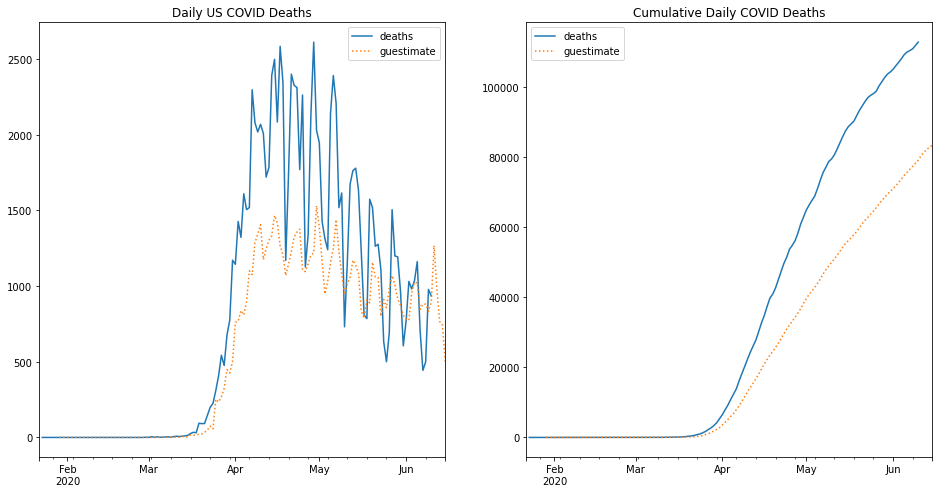

,deaths,guestimate
2020-06-10,112924.0,79197.966144
2020-06-11,NaN,80465.533513
2020-06-12,NaN,81443.867823
2020-06-13,NaN,82210.066876
2020-06-14,NaN,82952.117359
2020-06-15,NaN,83451.244213


In [ ]:
# deaths = global_deaths
# cofirmed = global_confirmed
deaths = global_deaths.copy()
confirmed = global_confirmed.copy()
max_correlation_days_lag = death_corrs[["confirmed"]].idxmax()[0]
my_range = 30


deaths = deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
confirmed = confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()

deaths = deaths.T
confirmed = confirmed.T

nations = {}
for nation in deaths.columns:
  nations[nation] = deaths[[nation]]
  nations[nation].columns = ["deaths"]
  nations[nation]["confirmed"] = confirmed[nation]

tmp = nations["US"][["deaths", "confirmed"]]

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)

corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])

daily_deaths["guestimate"] =  mean_ratio * daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]

for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

comparison = daily_deaths.copy() #will use this later

In [ ]:
mean_ratio

0.04347072112164656

Would this have worked for last 10 day? Let's go back in time and find out!

And the answer is, it overshoots by a bit! probably because the testing's been increasing on non-covid maybe?

I feel like doing some stuff with a MA window might improve this to get past some of the noise, but I gotta get back to working on my thesis edits

,0 Days Ago,1 Days Ago,2 Days Ago,3 Days Ago,4 Days Ago,5 Days Ago,6 Days Ago
CumErrorRatio Yesterday (By Guestimate Ratio Date),-26.7%,-23.9%,-22.6%,-22.3%,-21.7%,-18.4%,-15.8%


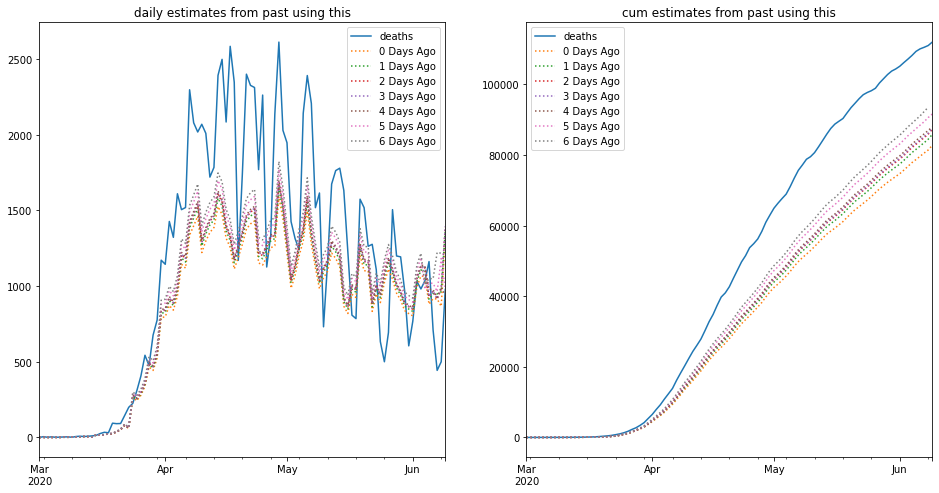

In [ ]:
import datetime

tmp.index=pd.to_datetime(tmp.index)

daily_deaths_original = tmp.diff()
daily_deaths_compare = tmp.diff()[["deaths"]]

daily_deaths_original.index = pd.to_datetime(daily_deaths_original.index)

for j in range(7):
  daily_deaths = daily_deaths_original[:-1-j]
  #print(len(daily_deaths))
  mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag])) for i in range(1,21)])
  #print(mean_ratio)
  daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
  startForecast = daily_deaths.index.max()
  cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
  for forecast in range(1,7):
    daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag]
  daily_deaths_compare["{} Days Ago".format(j)] = daily_deaths["guestimate"]
  #daily_deaths[["deaths", "guestimate"]].plot(title=j)

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")

markers = ["-"] + [":" for x in range(7)]

daily_deaths_compare[daily_deaths_compare.index >= datetime.datetime(2020,3,1)].plot(ax=ax1, style=markers, title="daily estimates from past using this")
daily_deaths_compare.cumsum()[daily_deaths_compare.index >= datetime.datetime(2020,3,1)].plot(ax=ax2, style=markers, title="cum estimates from past using this")

final_compare = daily_deaths_compare.cumsum()[-2:-1]
idx = final_compare.index[-1]
ratio_df = pd.DataFrame()

for col in daily_deaths_compare.columns:
  if col == "deaths":
    continue
  ratio_df.at["CumErrorRatio Yesterday (By Guestimate Ratio Date)", col] = np.round(100*(final_compare.at[idx, col]-final_compare.at[idx, "deaths"])/final_compare.at[idx, "deaths"],1).astype("str")+"%"

display(ratio_df)


#Comparing deaths by country after hitting a death threshold

Below is the 5 day moving average for the percent change in total deaths by country on the nth day after hitting specified deaths. The United States and France are not going the right direction here. Oh, wait, why did I keep log scale?

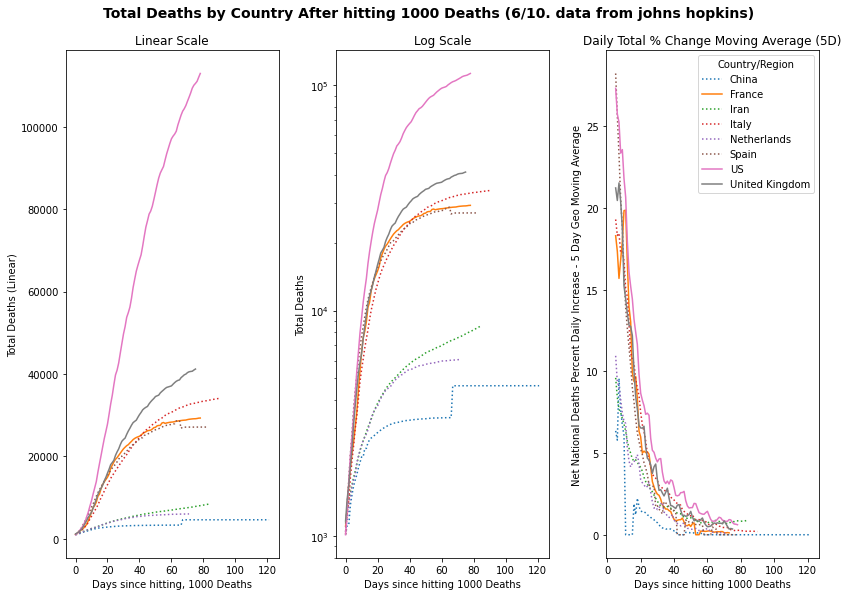

In [ ]:
# Source File
country_deaths = global_deaths.copy()

# Calculated from this date (date reached the death_metric)
death_metric_date = "4/1/20"

# Number of deaths to use as baseline
death_metric = 1000

fig, [ax1, ax2, ax3] = plt.subplots(nrows = 1, ncols =3, figsize=(12,8), facecolor="w")

country_deaths = country_deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
country_deaths = country_deaths[country_deaths[death_metric_date] > death_metric]
country_deaths = country_deaths.T
country_percent_deaths = (country_deaths.diff()/country_deaths.shift())

for country in country_deaths.columns:
    df = country_deaths[[country]]
    df = df[df[country] > death_metric]
    df = 100*(df.diff()/df.shift())
    df = df.rolling(5).agg(gmean).dropna()
    if len(df) < 3:
        continue

    style = ":"
    if country == "US" or country == "France" or country== "United Kingdom":
      style = "-"

    df.index = range(5, len(df)+5)
    df.plot(ax=ax3, style=style)
    df = country_deaths[[country]]
    df = df[df[country] >= death_metric]
    df.index = range(len(df))

    df.plot(ax=ax1, style=style, logy=False)

    df.plot(ax=ax2, style=style, logy=True)

ax1.get_legend().remove()
ax2.get_legend().remove()

ax1.set_ylabel("Total Deaths (Linear)")
ax2.set_ylabel("Total Deaths")
ax3.set_ylabel("Net National Deaths Percent Daily Increase - 5 Day Geo Moving Average")

ax1.set_xlabel("Days since hitting, {} Deaths".format(death_metric))
ax2.set_xlabel("Days since hitting {} Deaths".format(death_metric))
ax3.set_xlabel("Days since hitting {} Deaths".format(death_metric))

ax1.set_title("Linear Scale")
ax2.set_title("Log Scale")
ax3.set_title("Daily Total % Change Moving Average (5D)")

fig.suptitle("Total Deaths by Country After hitting {} Deaths ({}. data from johns hopkins)".format(death_metric, "/".join(country_deaths.index[-1].split("/")[:2])), y=1.03, fontsize=14, weight="bold")
fig.tight_layout()
plt.show()


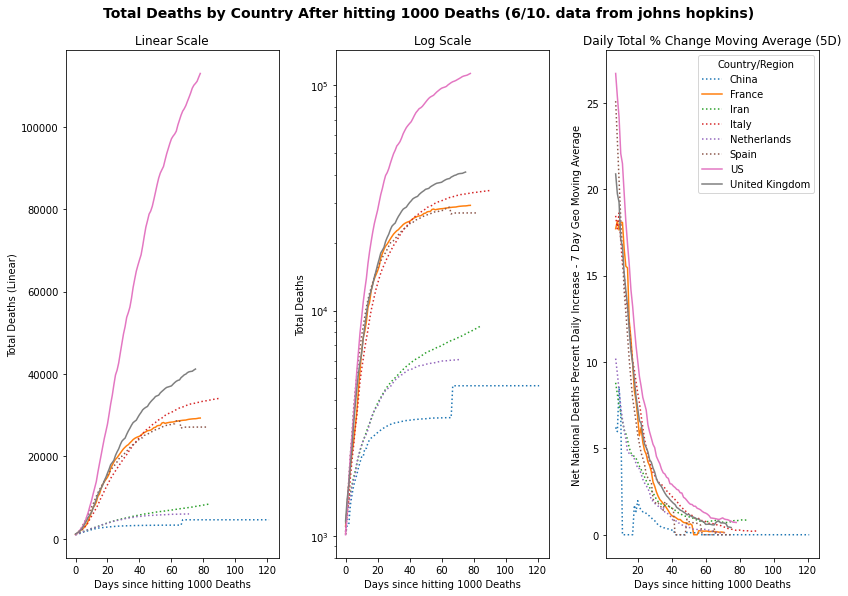

Country/Region,US
6/8/20,111011
6/9/20,111989
6/10/20,112924


In [ ]:
# Source File
country_deaths = global_deaths.copy()

# Calculated from this date (date reached the death_metric)
death_metric_date = "4/1/20"

# Number of deaths to use as baseline
death_metric = 1000

# Moving Average Range
mar = 7

# Countries to Compare
C1='US'
C2='France'
C3='United Kingdom'


fig, [ax1, ax2, ax3] = plt.subplots(nrows = 1, ncols =3, figsize=(12,8), facecolor="w")

country_deaths = country_deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
country_deaths = country_deaths[country_deaths[death_metric_date] > death_metric]
country_deaths = country_deaths.T
country_percent_deaths = (country_deaths.diff()/country_deaths.shift())

for country in country_deaths.columns:
    df = country_deaths[[country]]
    df = df[df[country] > death_metric]
    df = 100*(df.diff()/df.shift())
    df = df.rolling(mar).agg(gmean).dropna()
    if len(df) < 3:
        continue
    style = ":"
    if country == C1  or country == C2  or country== C3 :
      style = "-"

    df.index = range(mar, len(df)+mar)
    df.plot(ax=ax3, style=style)
    df = country_deaths[[country]]
    df = df[df[country] >= death_metric]
    df.index = range(len(df))

    df.plot(ax=ax1, style=style, logy=False)
    df.plot(ax=ax2, style=style, logy=True)

ax1.get_legend().remove()
ax2.get_legend().remove()

ax1.set_ylabel("Total Deaths (Linear)")
ax2.set_ylabel("Total Deaths")
ax3.set_ylabel("Net National Deaths Percent Daily Increase - {} Day Geo Moving Average".format(mar))

ax1.set_xlabel("Days since hitting {} Deaths".format(death_metric))
ax2.set_xlabel("Days since hitting {} Deaths".format(death_metric))
ax3.set_xlabel("Days since hitting {} Deaths".format(death_metric))

ax1.set_title("Linear Scale")
ax2.set_title("Log Scale")
ax3.set_title("Daily Total % Change Moving Average (5D)")

fig.suptitle("Total Deaths by Country After hitting {} Deaths ({}. data from johns hopkins)".format(death_metric,"/".join(country_deaths.index[-1].split("/")[:2])), y=1.03, fontsize=14, weight="bold")
fig.tight_layout()
plt.show()

display(country_deaths[["US"]][-3:])    


# What if we exclude some states?

In [ ]:

#LOAD US DAILY DATA from JH
tmp = US_daily.copy()
df = pd.DataFrame()

tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

# establish states to be eliminated
exclude =["New York", "New Jersey", "California"]
#exclude = ["New York", "New Jersey"]
exclude_str = prep_list_of_str(exclude)
if exclude_str == '':
  exclude_str = "No States Excluded"
else:
  exclude_str = exclude_str + " Excluded"

# create targets list eliminating all those in 
targets = [x for x in tmp[(tmp["Country/Region"] == "US")]["Province/State"].unique() if x not in exclude]

# interesction with targets creates a dataframe w/o excluded states
tmp = tmp[tmp["Province/State"].isin(targets)]
#print(tmp["Province/State"].isin(targets))
#print(tmp)

#create new dataframe rows (for today's daily)
df.loc[yesterday_csv[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[yesterday_csv[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

# iterate over all daily files - summarize death/confirmed by date
for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

#print("XXX",x[:-4])
#print(df.shape)
#print(df)

# sort index (the date, x[:4]) and cast that index to datetime data type
df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)
#print(df)

# copy to tmp
tmp = df.copy()
my_range = 30

# turn corr_tmp in daily deltas
corr_tmp = (tmp.diff())
#print('tmp.diff',corr_tmp)

#creates shifted correlation data frame indexed by i of deaths/confirmed
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)

#print(corr_tmp.to_markdown())

#run correlation on df
corr_df = corr_tmp.corr()
#print(corr_df)

death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

#creates 
for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

print(death_corrs.to_markdown())

#obtain the largest confirmed correlation lag off shifted df -> changed to deaths instead of confirmed
max_correlation_days_lag = death_corrs[["confirmed"]].idxmax()[0]

print('Days Lag: ', max_correlation_days_lag)

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)
print(daily_deaths.to_markdown())

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
print('mean-ratio',mean_ratio)

daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
print(daily_deaths.to_markdown())

daily_deaths["diff_ratio"] = (daily_deaths["deaths"]-daily_deaths["guestimate"])/daily_deaths["deaths"]
print(daily_deaths.to_markdown())

startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths With {}".format(exclude_str))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

They say there's lies, damned lies, and statistics. On the one hand, we could look at how the deaths look as a proportion of the total country population, but that's not what this is measuring so I'm not going to include here, but it begs the question what this is measuring.

The death rate is a signal of policy response to COVID. There's two situations to consider.

Situation 1: Everyone in each counry gets infected.

If everyone in the country's going to get infected, then looking at deaths as a proportion of overall country population does make sense (once deaths exceed noise). So like... if a country of 1M pop has 1k deaths and a country of 10M pop has 2k deaths and both had 100% infection, one can argue the 10M pop country policies were better because lesss % died.

Situation 2: Not everyone infected.

If we don't want everyone infected, then the overall country population matters less. The goal's to limit the spread of the virus, where getting to [situation 1] is a failure of policy. In the situation of limiting spread, more cases = worse policy regardless of overall population. So here, we look at effectiveness of policy as being lower rate of spread or lower overall people infected, where lower rate of spread is generally going to be associated with less people infected (and dead) unless the virus dissappears. Population's just a ceiling for max possible infections, in which case we're in situation 1 (albeit density, which is related to population, probably does matter).

Right now, conservative politicians are trying to swing this response as a success despite the US allowing this thing to spread out of control. For what it's worth, I dont think this is new; I argued via the Marine Corps Gazette a few years back (https://mca-marines.org/wp-content/uploads/The-Application-of-Maneuver-Toward-Psychology.pdf) that the fact that we didn't even speak the local language in Afghanistan (I do speak it) was indicative that US policy was completely detached from reality, and I think we're seeing similar detachment applied here in the US. The lack of understanding of the situation of Afghanistan due to not speaking the local language is similar to the lack of understanding of the scope of the COVID problem in the US due to a lack of testing.

# What if we Include a Subset of States

Days Lag:  6


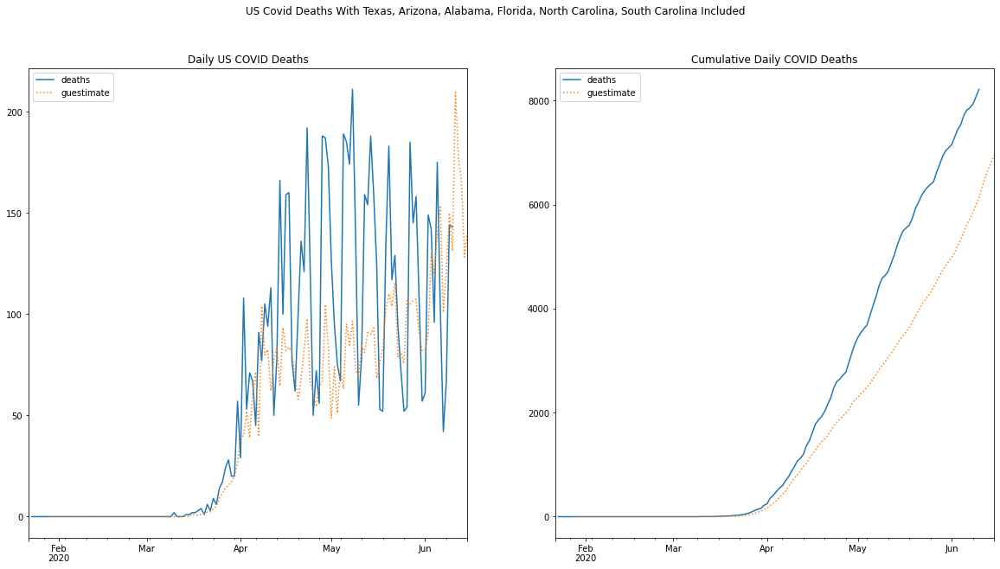

,deaths,guestimate
2020-06-10,8216.0,6128.597858
2020-06-11,NaN,6338.089770
2020-06-12,NaN,6515.384717
2020-06-13,NaN,6680.545838
2020-06-14,NaN,6808.684682
2020-06-15,NaN,6950.227170


In [ ]:

#LOAD US DAILY DATA from JH
tmp = US_daily.copy()
df = pd.DataFrame()

tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

# establish states to be included
include=["Texas", "Arizona", "Alabama", "Florida","North Carolina", "South Carolina"]

include_str = prep_list_of_str(include)
if include_str == '':
  include_str = "No States Included"
else:
  include_str = include_str + " Included"

# create targets list eliminating all those in 
targets = [x for x in tmp[(tmp["Country/Region"] == "US")]["Province/State"].unique() if x in include]

# interesction with targets creates a dataframe included states
tmp = tmp[tmp["Province/State"].isin(targets)]
#print(tmp["Province/State"].isin(targets))
#print(tmp)

#create new dataframe rows (for today's daily)
df.loc[yesterday_csv[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[yesterday_csv[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

# iterate over all daily files - summarize death/confirmed by date
for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

#print("XXX",x[:-4])
#print(df.shape)
#print(df)

# sort index (the date, x[:4]) and cast that index to datetime data type
df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)
#print(df)

# copy to tmp
tmp = df.copy()
my_range = 30

# turn corr_tmp in daily deltas
corr_tmp = (tmp.diff())
#print('tmp.diff',corr_tmp)

#creates shifted correlation data frame indexed by i of deaths/confirmed
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)
#print(corr_tmp.to_markdown())

#run correlation on df
corr_df = corr_tmp.corr()
#print(corr_df)

death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

#creates 
for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]
#print(death_corrs.to_markdown())

#obtain the largest confirmed correlation lag off shifted df -> changed to deaths instead of confirmed
max_correlation_days_lag = death_corrs[["confirmed"]].idxmax()[0]
print('Days Lag: ', max_correlation_days_lag)

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)
#print(daily_deaths.to_markdown())

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
#print('mean-ratio',mean_ratio)

daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
#print(daily_deaths.to_markdown())

daily_deaths["diff_ratio"] = (daily_deaths["deaths"]-daily_deaths["guestimate"])/daily_deaths["deaths"]
#print(daily_deaths.to_markdown())

startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(20,10), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths With {}".format(include_str))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

#US Data - looking at national and by-state doubling times

this generates linear and log graphs of US death rates (need to run the code in the next block that defins run() first)

# Just lookin at Last Week

2020-06-10 16:06:30.488827
06-09-2020.csv


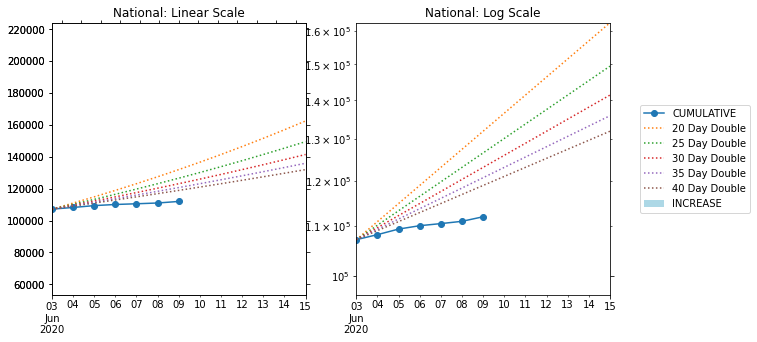

In [ ]:
"""

K, so this got a bit long but I'm combining it with the function call, just setting the DEATH_CUTOFF to
1000 as threshhold here which gets used below

"""
DEATH_CUTOFF = 1000

import matplotlib.pyplot as plt
import datetime as dt, numpy as np, pandas as pd, os

us_deaths = pd.DataFrame()
state_deaths = pd.DataFrame()

# Get Yesterday's data drop
print(dt.datetime.now())
xx = dt.datetime.now() - timedelta(days=1)
print(xx.strftime("%m-%d-%Y") + ".csv")
x = xx.strftime("%m-%d-%Y") + ".csv"

# can override with a specific data drop date
# x = "06-09-2020.csv"


tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

us_deaths.loc[x[:-4], "CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
state_deaths[x[:-4]] =tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
    if not x.endswith("2020.csv"):
        continue
    try:
      tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
    except:
      pass
    tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

    us_deaths.loc[x[:-4], "CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
    state_deaths[x[:-4]] =tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

us_deaths.sort_index(inplace=True)
us_deaths.index = pd.to_datetime(us_deaths.index)

state_deaths = state_deaths[sorted([x for x in state_deaths.columns])].fillna(0)

td = us_deaths[-7:].T

testing = td.copy()

#Set up to go a few days into the future
maxDate = td.columns.max()
try:
  for i in range(1,7):
      td[str(maxDate + dt.timedelta(days=i))] = np.NaN
except:
  pass
td = td.T

td.index = pd.to_datetime(td.index)

td["day"] = range(len(td))


"""
Figure out math for exponents for exponential growth
"""

days = pd.DataFrame()
days["d"] = [20, 25,30,35, 40]
#daily rate to double every x days
days["r"] = days.d.apply(lambda x: 2**(1/(x)))

#Give value of expected value along each exponential for doubling period
for i in range(len(days)):
  td["{} Day Double".format(days["d"][i])] = td["day"].apply(lambda x: td.CUMULATIVE[0] *(days.r[i]**x))

#set up plots
fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(10,5), facecolor="w")


styles = ["o-"] + [":" for i in range(len(days))]
td[[x for x in td.columns if x != "day"]].plot(style=styles, title="National: Linear Scale", ax = ax1)
ax1Max = td["CUMULATIVE"].max()
ax1Min = td["CUMULATIVE"].min()
total_max = td.max().max()

td[[x for x in td.columns if x != "day"]].plot(style=styles, title="National: Log Scale", ax = ax2)
#fulocs, fulabels = ax2.yticks()

ax1.set_ylim((ax1Min/2, ax1Max*2))
ax1.yaxis.tick_left()
ax1.yaxis.set_ticks_position('both')

ax2.set_ylim((ax1Min*.9, total_max))
#ax2.yaxis.tick_right()
ax2.yaxis.set_ticks_position('both')

#shinanigans to make these plot together with bar

td = td.diff()[["CUMULATIVE"]].rename(columns={"CUMULATIVE":"INCREASE"})
td.index = pd.to_datetime(td.index)
#td.loc()[td.index[0], "ACTUAL CHANGE"] = 0
td.fillna(0, inplace=True)


ax1tmp = ax1.twiny()
td.plot(kind='bar', color="lightblue", ax=ax1tmp)
ax1tmp.set_xticklabels([])


#ax2.set_ylim(20)
ax2.set_yscale("log")
#ax2tmp = ax2.twiny()
#td.plot(kind='bar', color="lightblue", ax=ax2tmp)
#ax2tmp.set_xticklabels([])
#ax2tmp.yaxis.set_ticks_position("none")

lines, labels = ax2.get_legend_handles_labels()
lines2, labels2 = ax1tmp.get_legend_handles_labels()
ax2.legend(lines + lines2, labels + labels2, loc='center left', bbox_to_anchor=(1.1, 0.5))

#ax2tmp.get_legend().remove()

#shinanigans done

ax1tmp.get_legend().remove()
ax1.get_legend().remove()

#US Data - Moving Weekly Change

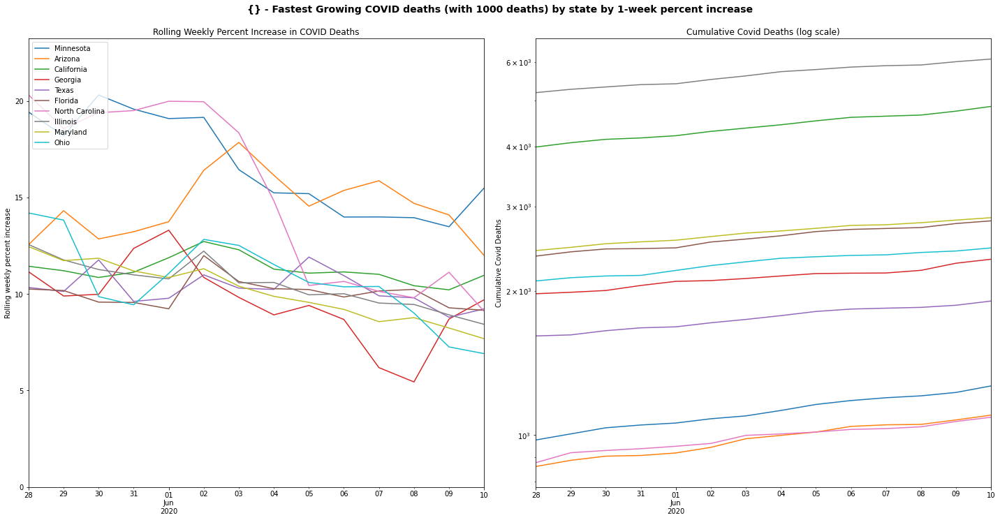

In [ ]:
# establishes metric for 'at least xx deaths"
death_cutoff = 1000


us_deaths = pd.DataFrame()
state_deaths = pd.DataFrame()

tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + yesterday_csv)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

us_deaths.loc[x[:-4], "CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
state_deaths[x[:-4]] =tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
    if not x.endswith("2020.csv"):
        continue
    try:
      tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
    except:
      pass
    tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

    us_deaths.loc[x[:-4], "CUMULATIVE"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
    state_deaths[x[:-4]] =tmp[tmp["Country/Region"] == "US"].groupby('Province/State').sum()["Deaths"]

us_deaths.sort_index(inplace=True)
us_deaths.index = pd.to_datetime(us_deaths.index)

state_deaths = state_deaths[sorted([x for x in state_deaths.columns])].fillna(0)
tmp = state_deaths.T

#print(us_deaths.to_markdown())
#print(state_deaths.to_markdown())

fig, [ax, ax1] = plt.subplots(nrows=1, ncols=2, figsize=(20,10), facecolor="w")

"""
This section goes and pulls states with more deaths than the cutoff for today
"""
weekly_increases = []
state_dfs = {}
for state in tmp.columns:
  if tmp[[state]][state].max() < death_cutoff: #only checking states with at least date_cutoff deaths; otherwise just noise
    continue
  state_dfs[state] = tmp[[state]]
  state_dfs[state].index = pd.to_datetime(state_dfs[state].index)
  state_dfs[state]["WeekPrior"] = state_dfs[state][state].shift(7)
  state_dfs[state]["WeekPercentIncrease"] = 100*(state_dfs[state][state] - state_dfs[state]["WeekPrior"])/state_dfs[state]["WeekPrior"]
  state_dfs[state].replace(np.inf, 0, inplace=True)
  state_dfs[state].fillna(0, inplace=True)
  weekly_increases.append((state_dfs[state]["WeekPercentIncrease"][-1], state))
  

max_percent_increase = -1
for _, state in sorted(weekly_increases, reverse=True)[:10]:
  state_dfs[state][-14:]["WeekPercentIncrease"].plot(ax=ax, label=state)
  state_dfs[state][-14:][state].plot(ax=ax1, label=state, logy=True)

  if state_dfs[state][-14:]["WeekPercentIncrease"][-1] > max_percent_increase:
    max_percent_increase = state_dfs[state][-14:]["WeekPercentIncrease"][-1]

ax.set_ylim(0, max_percent_increase*1.5)

ax.legend(loc="upper left")

ax.set_ylabel("Rolling weekly percent increase")
ax1.set_ylabel("Cumulative Covid Deaths")

ax.set_title("Rolling Weekly Percent Increase in COVID Deaths")
ax1.set_title("Cumulative Covid Deaths (log scale)")

fig.suptitle("{} - Fastest Growing COVID deaths (with " + str(death_cutoff) + " deaths) by state by 1-week percent increase".format(us_deaths.index.max().strftime("%m-%d-%Y")), y=1.03, fontsize=14, weight="bold")
fig.tight_layout()

plt.show()



In [ ]:
max_deaths

30458.0

Did I screw something up? let me know at brockman@email.arizona.edu

2020-06-10 16:06:37.434772
06-09-2020.csv


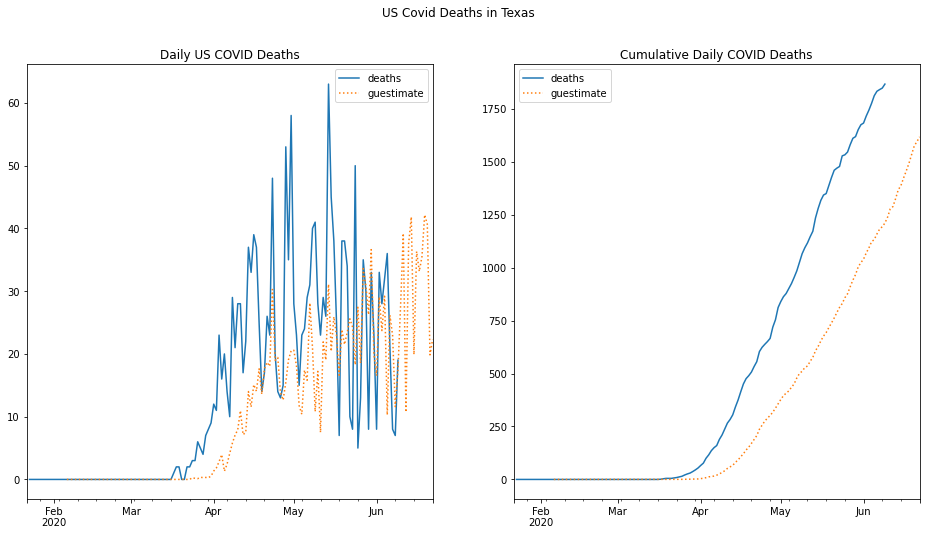

,deaths,guestimate
2020-06-09,1867.0,1210.804528
2020-06-10,NaN,1238.562270
2020-06-11,NaN,1277.765848
2020-06-12,NaN,1288.471197
2020-06-13,NaN,1326.003387
2020-06-14,NaN,1367.830410
2020-06-15,NaN,1387.738973
2020-06-16,NaN,1424.065225
2020-06-17,NaN,1457.217954
2020-06-18,NaN,1492.719090


In [ ]:
import os

df = pd.DataFrame()

# Get Yesterday's data drop
print(dt.datetime.now())
xx = dt.datetime.now() - timedelta(days=1)
print(xx.strftime("%m-%d-%Y") + ".csv")
x = xx.strftime("%m-%d-%Y") + ".csv"

# can override with a specific data drop date
# x = "06-09-2020.csv"


tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

targets = ["Texas"]

tmp = tmp[tmp["Province/State"].isin(targets)]

df.loc[x[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()


for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)

tmp = df.copy()


my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]


daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths in {}".format(";".join(targets)))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

In [ ]:
print("Days Lag:{}\nRatio:{}".format(max_correlation_days_lag,mean_ratio))


Days Lag:14
Ratio:0.021156815102819727


2020-06-10 16:06:40.011780
06-09-2020.csv


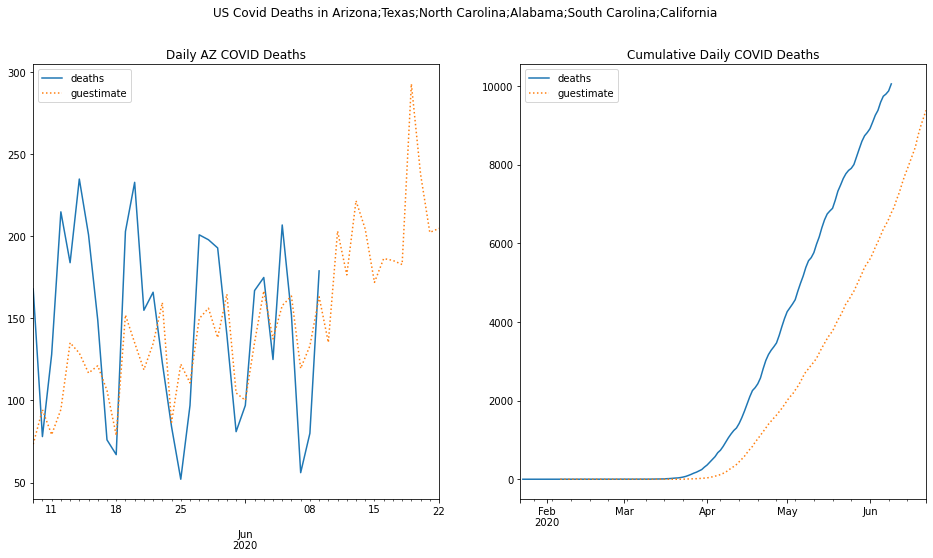

,deaths,guestimate
2020-06-09,10053.0,6774.201579
2020-06-10,NaN,6909.654160
2020-06-11,NaN,7112.938876
2020-06-12,NaN,7289.520170
2020-06-13,NaN,7511.282566
2020-06-14,NaN,7715.776950
2020-06-15,NaN,7887.791747
2020-06-16,NaN,8074.322561
2020-06-17,NaN,8259.704190
2020-06-18,NaN,8442.606000


In [ ]:
import os

df = pd.DataFrame()
# Get Yesterday's data drop
print(dt.datetime.now())
xx = dt.datetime.now() - timedelta(days=1)
print(xx.strftime("%m-%d-%Y") + ".csv")
x = xx.strftime("%m-%d-%Y") + ".csv"

# can override with a specific data drop date
# x = "06-09-2020.csv"

tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

targets = ["Arizona", "Texas", "North Carolina", 'Alabama', 'South Carolina', 'California']

tmp = tmp[tmp["Province/State"].isin(targets)]

df.loc[x[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()


for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)

tmp = df.copy()


my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]


daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]][-45:].plot(ax=ax1, style=["-", ":"], title="Daily AZ COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths in {}".format(";".join(targets)))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

Colorado's wierd, it doesn't like this method; I take that back, it's settled now an working-ish

2020-06-10 16:06:42.548333
06-09-2020.csv


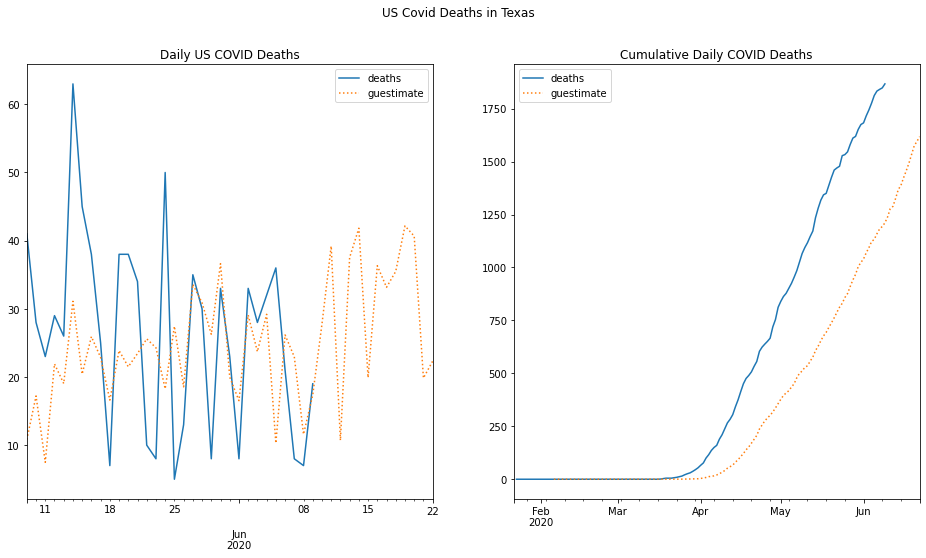

,deaths,guestimate
2020-06-09,1867.0,1210.804528
2020-06-10,NaN,1238.562270
2020-06-11,NaN,1277.765848
2020-06-12,NaN,1288.471197
2020-06-13,NaN,1326.003387
2020-06-14,NaN,1367.830410
2020-06-15,NaN,1387.738973
2020-06-16,NaN,1424.065225
2020-06-17,NaN,1457.217954
2020-06-18,NaN,1492.719090


In [ ]:
import os

df = pd.DataFrame()
# Get Yesterday's data drop
print(dt.datetime.now())
xx = dt.datetime.now() - timedelta(days=1)
print(xx.strftime("%m-%d-%Y") + ".csv")
x = xx.strftime("%m-%d-%Y") + ".csv"

# can override with a specific data drop date
# x = "06-09-2020.csv"



tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

targets = ["Texas"]

tmp = tmp[tmp["Province/State"].isin(targets)]

df.loc[x[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()


for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)

tmp = df.copy()


my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]


daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]][-45:].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths in {}".format(";".join(targets)))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

2020-06-10 16:06:45.059329
06-09-2020.csv


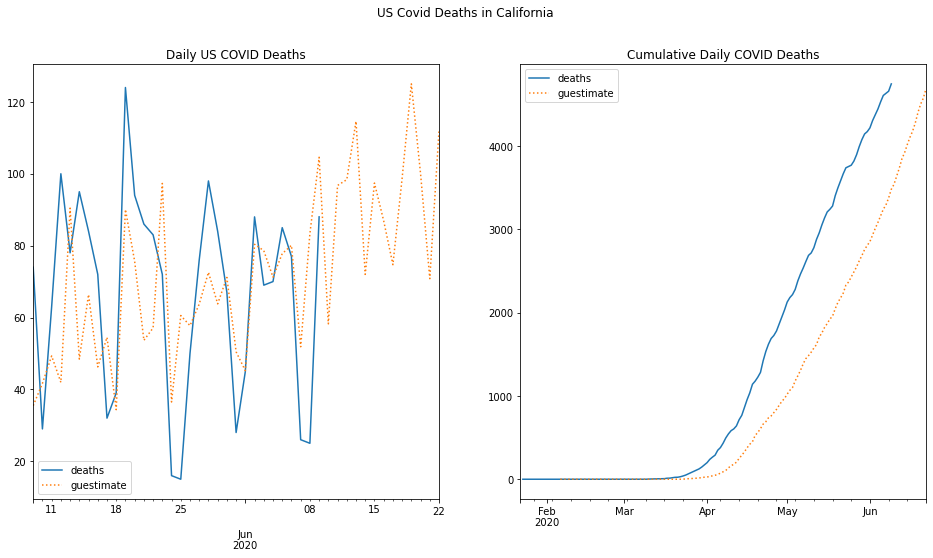

,deaths,guestimate
2020-06-09,4745.0,3480.084993
2020-06-10,NaN,3538.315762
2020-06-11,NaN,3635.063574
2020-06-12,NaN,3733.422099
2020-06-13,NaN,3848.027814
2020-06-14,NaN,3920.019672
2020-06-15,NaN,4017.432779
2020-06-16,NaN,4104.341237
2020-06-17,NaN,4179.029288
2020-06-18,NaN,4277.772983


In [ ]:
import os

df = pd.DataFrame()

# Get Yesterday's data drop
print(dt.datetime.now())
xx = dt.datetime.now() - timedelta(days=1)
print(xx.strftime("%m-%d-%Y") + ".csv")
x = xx.strftime("%m-%d-%Y") + ".csv"

# can override with a specific data drop date
# x = "06-09-2020.csv"



tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

targets = ["California"]

tmp = tmp[tmp["Province/State"].isin(targets)]

df.loc[x[:-4], "deaths"] = tmp[(tmp["Country/Region"] == "US")]["Deaths"].sum()
df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()


for x in os.listdir("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/"):
  if not x.endswith("2020.csv"):
      continue
  try:
    tmp = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_daily_reports/" + x)
  except:
    pass
  tmp.rename(columns={"Country_Region":"Country/Region", "Province_State":"Province/State"}, inplace=True)

  tmp = tmp[tmp["Province/State"].isin(targets)]

  df.loc[x[:-4], "deaths"] = tmp[tmp["Country/Region"] == "US"]["Deaths"].sum()
  df.loc[x[:-4], "confirmed"] = tmp[tmp["Country/Region"] == "US"]["Confirmed"].sum()

df.sort_index(inplace=True)
df.index = pd.to_datetime(df.index)

tmp = df.copy()


my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]


daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)


ratios = [((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)]
mean_ratio = np.mean([ratio for ratio in ratios[-14:] if ratio != np.inf])

daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]][-45:].plot(ax=ax1, style=["-", ":"], title="Daily US COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("US Covid Deaths in {}".format(";".join(targets)))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

# What about the UK?

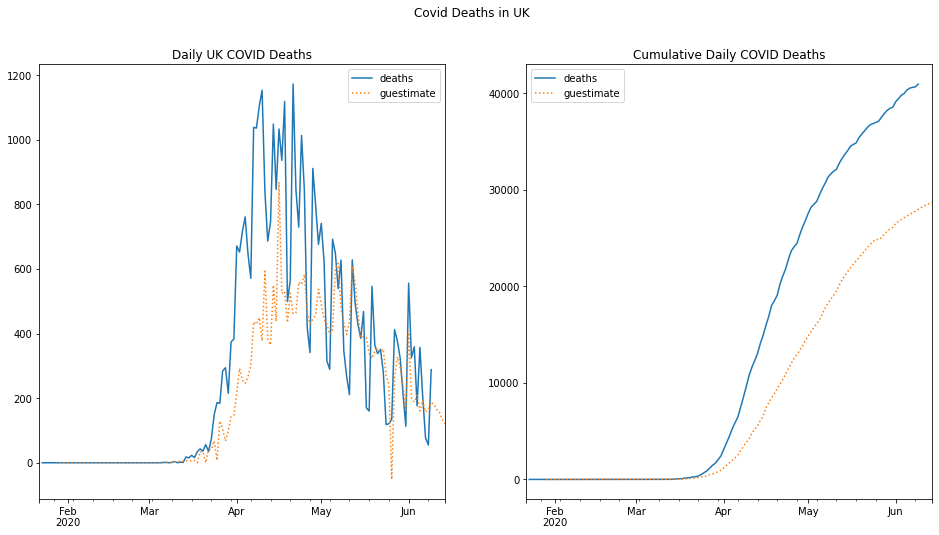

,deaths,guestimate
2020-06-09,40968.0,27982.027703
2020-06-10,NaN,28161.995308
2020-06-11,NaN,28326.642287
2020-06-12,NaN,28481.838231
2020-06-13,NaN,28613.854268
2020-06-14,NaN,28734.529063


In [ ]:
deaths = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")
confirmed = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")

deaths = deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
confirmed = confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()

deaths = deaths.T
confirmed = confirmed.T

nations = {}
for nation in deaths.columns:
  nations[nation] = deaths[[nation]]
  nations[nation].columns = ["deaths"]
  nations[nation]["confirmed"] = confirmed[nation]


tmp = nations["United Kingdom"][["deaths", "confirmed"]]
tmp.index = pd.to_datetime(tmp.index)

my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily UK COVID Deaths")

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("Covid Deaths in UK")

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

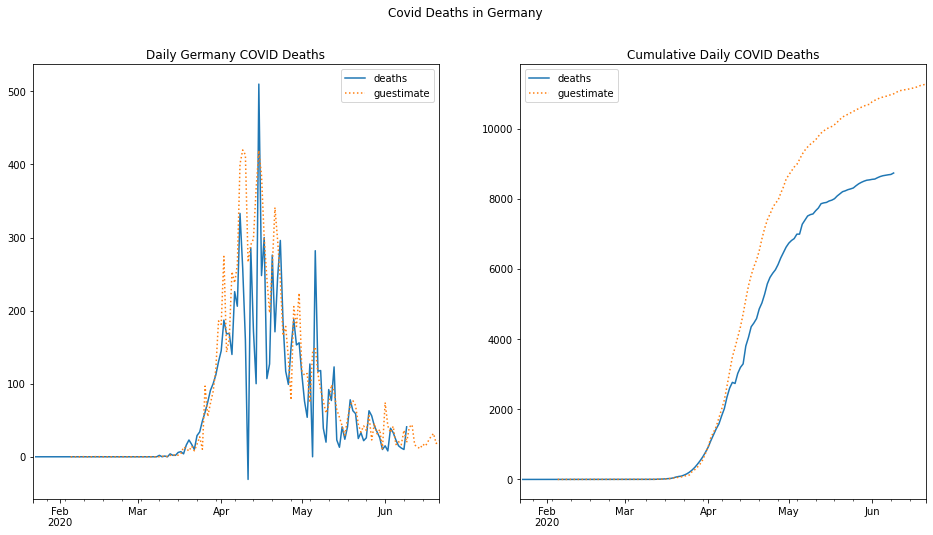

,deaths,guestimate
2020-06-09,8736.0,10993.093115
2020-06-10,NaN,11033.789434
2020-06-11,NaN,11077.755992
2020-06-12,NaN,11093.925512
2020-06-13,NaN,11107.309271
2020-06-14,NaN,11118.452311
2020-06-15,NaN,11135.711911
2020-06-16,NaN,11150.367430
2020-06-17,NaN,11171.623990
2020-06-18,NaN,11198.997109


In [ ]:
deaths = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")
confirmed = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")

deaths = deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
confirmed = confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()

deaths = deaths.T
confirmed = confirmed.T

nations = {}
for nation in deaths.columns:
  nations[nation] = deaths[[nation]]
  nations[nation].columns = ["deaths"]
  nations[nation]["confirmed"] = confirmed[nation]


trgCounty = "Germany"

tmp = nations[trgCounty][["deaths", "confirmed"]]
tmp.index = pd.to_datetime(tmp.index)

my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily {} COVID Deaths".format(trgCounty))

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("Covid Deaths in {}".format(trgCounty))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])

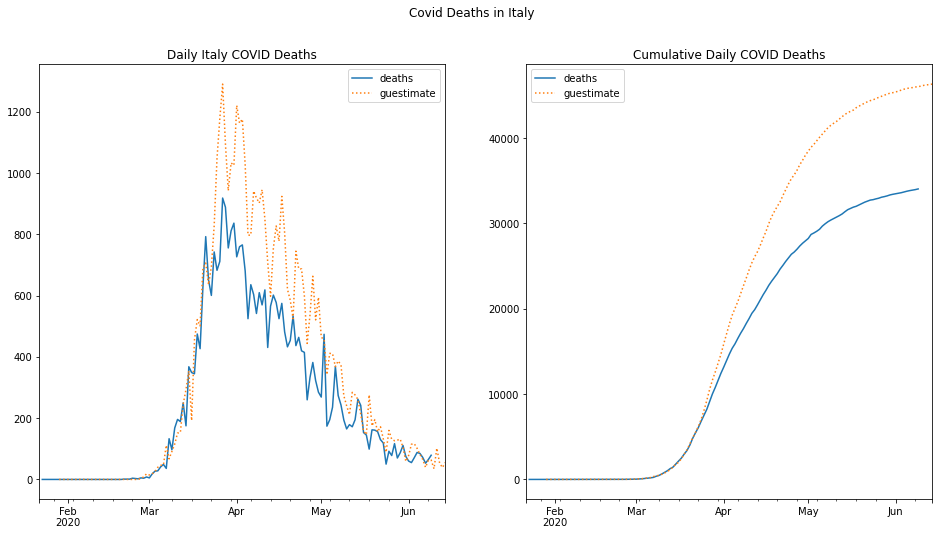

,deaths,guestimate
2020-06-09,34043.0,46045.630803
2020-06-10,NaN,46080.484617
2020-06-11,NaN,46182.486177
2020-06-12,NaN,46235.653014
2020-06-13,NaN,46274.445113
2020-06-14,NaN,46329.581091


In [ ]:
deaths = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_deaths_global.csv")
confirmed = pd.read_csv("COVID-19/csse_covid_19_data/csse_covid_19_time_series/time_series_covid19_confirmed_global.csv")

deaths = deaths.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()
confirmed = confirmed.drop(["Province/State", "Lat", "Long"], axis=1).groupby("Country/Region").sum()

deaths = deaths.T
confirmed = confirmed.T

nations = {}
for nation in deaths.columns:
  nations[nation] = deaths[[nation]]
  nations[nation].columns = ["deaths"]
  nations[nation]["confirmed"] = confirmed[nation]


trgCounty = "Italy"

tmp = nations[trgCounty][["deaths", "confirmed"]]
tmp.index = pd.to_datetime(tmp.index)

my_range = 30

corr_tmp = (tmp.diff())
for i in range(my_range):
  corr_tmp["deaths_lag_{}".format(i)] = corr_tmp["deaths"].shift(i).fillna(0)
  corr_tmp["confirmed_lag_{}".format(i)] = corr_tmp["confirmed"].shift(i).fillna(0)


corr_df = corr_tmp.corr()
death_corrs = pd.DataFrame()
confirmed_corrs = pd.DataFrame()

for i in range(my_range):
  death_corrs.loc()[i, "deaths"] = corr_df.loc()["deaths", "deaths_lag_{}".format(i)]
  death_corrs.loc()[i, "confirmed"] = corr_df.loc()["deaths", "confirmed_lag_{}".format(i)]

max_correlation_days_lag = death_corrs[["confirmed"]][2:].idxmax()[0]

daily_deaths = tmp.diff()
daily_deaths.index = pd.to_datetime(daily_deaths.index)

mean_ratio = np.mean([((daily_deaths["deaths"][-i])/(daily_deaths["confirmed"][-i - max_correlation_days_lag+1])) for i in range(1,21)])
daily_deaths["guestimate"] =  mean_ratio*daily_deaths["confirmed"].shift(max_correlation_days_lag)
startForecast = daily_deaths.index.max()
cvals = daily_deaths.confirmed[-max_correlation_days_lag:]
for forecast in range(1,max_correlation_days_lag):
  daily_deaths.at[startForecast + dt.timedelta(days=forecast), "guestimate"] = mean_ratio * cvals[forecast-max_correlation_days_lag-1]

fig, [ax1, ax2] = plt.subplots(nrows=1, ncols=2, figsize=(16,8), facecolor="w")
daily_deaths[["deaths", "guestimate"]].plot(ax=ax1, style=["-", ":"], title="Daily {} COVID Deaths".format(trgCounty))

#(mean_ratio * daily_deaths["confirmed"]).shift(7).plot(ax=ax1)

daily_deaths[["deaths", "guestimate"]].cumsum().plot(ax=ax2, style=["-", ":"], title="Cumulative Daily COVID Deaths")

fig.suptitle("Covid Deaths in {}".format(trgCounty))

plt.show()

display(daily_deaths[["deaths","guestimate"]].cumsum()[-max_correlation_days_lag:])